In [3]:
import xarray as xr
import xesmf as xe
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import dask
import cftime
import random
import glob
import matplotlib.gridspec as gs

In [4]:
from dask.distributed import Client, LocalCluster
client = Client()
client

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 42719 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/42719/status,
Dashboard: /proxy/42719/status,Workers: 7
Total threads: 14,Total memory: 63.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34941,Workers: 7
Dashboard: /proxy/42719/status,Total threads: 14
Started: Just now,Total memory: 63.00 GiB
Comm: tcp://127.0.0.1:42177,Total threads: 2
Dashboard: /proxy/41525/status,Memory: 9.00 GiB
Nanny: tcp://127.0.0.1:39547,


In [5]:
#load in SST

In [6]:
ctrl_sst = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/ctrl_sst.nc",  use_cftime=True, chunks= {"time":240})
VC_sst = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/VAR_PACE_sst.nc",  use_cftime=True, chunks= {"time":240})
ctrl_sst = ctrl_sst.sst.compute()
VC_sst = VC_sst.sst.compute()

In [7]:
ctrl_z20 = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/ctrl_z20.nc",  use_cftime=True, chunks= {"time":240})
VC_z20 = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/Var_pace_z20.nc",  use_cftime=True, chunks= {"time":240})
ctrl_z20 = ctrl_z20.z20.compute()
VC_z20 = VC_z20.z20.compute()

In [8]:
OC_sst = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/OC_sst.nc",  use_cftime=True, chunks= {"time":240})
MC_sst = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/MC_sst.nc",  use_cftime=True, chunks= {"time":240})
OC_sst = OC_sst.sst.compute()
MC_sst = MC_sst.sst.compute()

In [9]:
OC_z20 = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/obs_pace_z20.nc",  use_cftime=True, chunks= {"time":240})
MC_z20 = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/mod_pace_z20.nc",  use_cftime=True, chunks= {"time":240})
OC_z20 = OC_z20.z20.compute()
MC_z20 = MC_z20.z20.compute()

In [10]:
#load in Qnet data
ctrl_q = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/ctrl_qnet.nc",  use_cftime=True, chunks= {"time":240})
OC_q = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/OC_qnet.nc",  use_cftime=True, chunks= {"time":240})
MC_q = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/MC_qnet.nc",  use_cftime=True, chunks= {"time":240})
VC_q = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/VC_qnet.nc",  use_cftime=True, chunks= {"time":240})


In [11]:
ctrl_q = ctrl_q.Qnet.compute()
OC_q = OC_q.Qnet.compute()
MC_q = MC_q.Qnet.compute()
VC_q = VC_q.Qnet.compute()

In [12]:
ctrl_q.attrs = {'long_name': 'surface heat flux seen by ocean (after restoring',
             'units': 'W / m -2',
             'valid_range': [-1300., 1300.],
             'cell_methods': 'time: mean',
             'time_avg_info': 'average_T1,average_T2,average_DT',
             'standard_name': 'qnet'}

In [13]:
OC_q.attrs = {'long_name': 'surface heat flux seen by ocean (after restoring',
             'units': 'W / m -2',
             'valid_range': [-1300., 1300.],
             'cell_methods': 'time: mean',
             'time_avg_info': 'average_T1,average_T2,average_DT',
             'standard_name': 'qnet'}

In [14]:
MC_q.attrs = {'long_name': 'surface heat flux seen by ocean (after restoring',
             'units': 'W / m -2',
             'valid_range': [-1300., 1300.],
             'cell_methods': 'time: mean',
             'time_avg_info': 'average_T1,average_T2,average_DT',
             'standard_name': 'qnet'}

In [15]:
VC_q.attrs = {'long_name': 'surface heat flux seen by ocean (after restoring',
             'units': 'W / m -2',
             'valid_range': [-1300., 1300.],
             'cell_methods': 'time: mean',
             'time_avg_info': 'average_T1,average_T2,average_DT',
             'standard_name': 'qnet'}

In [16]:
OC_z20.attrs = {'long_name': 'depth of 20oC isotherm',
             'units': 'm',
             'valid_range': [0., 500.],
             'cell_methods': 'time: mean',
             'time_avg_info': 'average_T1,average_T2,average_DT',
             'standard_name': 'z20_depth'}

In [17]:
VC_z20.attrs = {'long_name': 'depth of 20oC isotherm',
             'units': 'm',
             'valid_range': [0., 500.],
             'cell_methods': 'time: mean',
             'time_avg_info': 'average_T1,average_T2,average_DT',
             'standard_name': 'z20_depth'}

In [18]:
ctrl_z20.attrs = {'long_name': 'depth of 20oC isotherm',
             'units': 'm',
             'valid_range': [0., 500.],
             'cell_methods': 'time: mean',
             'time_avg_info': 'average_T1,average_T2,average_DT',
             'standard_name': 'z20_depth'}

In [19]:
MC_z20.attrs = {'long_name': 'depth of 20oC isotherm',
             'units': 'm',
             'valid_range': [0., 500.],
             'cell_methods': 'time: mean',
             'time_avg_info': 'average_T1,average_T2,average_DT',
             'standard_name': 'z20_depth'}

In [20]:
#load in wind stress for u

In [25]:
ctrl = xr.open_mfdataset("/g/data/hh5/tmp/zg0866/cm000_APP4_archive/cm000/history/ocn/ocean_month.nc-*",
                         use_cftime=True, chunks= {"time":240})

KeyboardInterrupt: 

In [ ]:
ctrl

In [ ]:
VC = xr.open_mfdataset("/g/data/e14/sm2435/PACE_OC/cy286/history/ocn/ocean_month.nc-*",
                         use_cftime=True, chunks= {"time":240})

In [ ]:
OC = xr.open_mfdataset("/g/data/e14/sm2435/PACE_OC/cw323/history/ocn/ocean_month.nc-*",
                         use_cftime=True, chunks= {"time":240})

In [ ]:
MC = xr.open_mfdataset("/g/data/hh5/tmp/zg0866/pacemaker/cs947/history/ocn/ocean_month.nc-*",
                         use_cftime=True, chunks= {"time":240})

In [ ]:
ctrl_u = ctrl.tau_x.compute()

In [ ]:
VC_u = VC.tau_x.compute()

In [ ]:
OC_u = OC.tau_x.compute()

In [ ]:
MC_u = MC.tau_x.compute()

In [ ]:
ctrl_u = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/ctrl_uwnd.nc",  use_cftime=True, chunks= {"time":240})
VC_u = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/var_uwnd.nc",  use_cftime=True, chunks= {"time":240})
ctrl_u = ctrl_u.tauu.compute()
VC_u = VC_u.tauu.compute()

In [ ]:
OC_u = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/ob_uwnd.nc",  use_cftime=True, chunks= {"time":240})
MC_u = xr.open_dataset("/g/data/e14/sm2435/Exps_ACCESS_initial/mod_uwnd.nc",  use_cftime=True, chunks= {"time":240})
OC_u = OC_u.tauu.compute()
MC_u = MC_u.tauu.compute()

In [ ]:
MC_sst = MC_sst.sel(time = slice("0951-01-01", "1100-12-31"))
MC_u = MC_u.sel(time = slice("0951-01-01", "1100-12-31"))
MC_z20 = MC_z20.sel(time = slice("0951-01-01", "1100-12-31"))
MC_q = MC_q.sel(time = slice("0951-01-01", "1100-12-31"))

In [ ]:
OC_sst = OC_sst.sel(time = slice("0951-01-01", "1009-12-31"))
OC_u = OC_u.sel(time = slice("0951-01-01", "1009-12-31"))
OC_z20 = OC_z20.sel(time = slice("0951-01-01", "1009-12-31"))
OC_q = OC_q.sel(time = slice("0951-01-01", "1009-12-31"))

In [ ]:
ctrl_sst = ctrl_sst.sel(time = slice("0951-01-01", "1150-12-31"))
ctrl_u = ctrl_u.sel(time = slice("0951-01-01", "1150-12-31"))
ctrl_z20 = ctrl_z20.sel(time = slice("0951-01-01", "1150-12-31"))
ctrl_q = ctrl_q.sel(time = slice("0951-01-01", "1150-12-31"))

In [ ]:
VC_sst = VC_sst.sel(time = slice("0951-01-01", "1009-12-31"))
VC_u = VC_u.sel(time = slice("0951-01-01", "1009-12-31"))
VC_q = VC_q.sel(time = slice("0951-01-01", "1009-12-31"))

In [ ]:
#move the u wind stress onto the t-cell

In [ ]:
import xgcm

In [ ]:
ds3 = xr.merge([OC_sst, OC_u])
ds4 = xr.merge([MC_sst, MC_u])
ds3 = ds3.drop(['geolon_t', 'geolat_t'])
ds4 = ds4.drop(['geolon_t', 'geolat_t'])

In [ ]:
ds1 = xr.merge([ctrl_sst, ctrl_u])

In [ ]:
ds1 = ds1.drop(['geolon_t', 'geolat_t'])

In [ ]:
grid1 = xgcm.Grid(
    ds1,
    coords={"X": {"center": "xt_ocean", "right": "xu_ocean"},
            "Y": {"center": "yt_ocean", "right": "yu_ocean"}}
)


In [ ]:
ctrl_u_ = grid1.interp(ds1.tauu, axis = ["X", "Y"], to="center")

In [ ]:
ctrl_u_.attrs = ctrl_u.attrs

In [ ]:
ds2 = xr.merge([VC_sst, VC_u])

In [ ]:
ds2 = ds2.drop(['geolon_t', 'geolat_t'])

In [ ]:
grid2 = xgcm.Grid(
    ds2,
    coords={"X": {"center": "xt_ocean", "right": "xu_ocean"},
            "Y": {"center": "yt_ocean", "right": "yu_ocean"}}
)


In [ ]:
VC_u_ = grid2.interp(ds2.tauu, axis = ["X", "Y"], to="center")

In [ ]:
VC_u_.attrs = VC_u.attrs

In [ ]:
grid3 = xgcm.Grid(
    ds3,
    coords={"X": {"center": "xt_ocean", "right": "xu_ocean"},
            "Y": {"center": "yt_ocean", "right": "yu_ocean"}}
)
OC_u_ = grid3.interp(ds3.tauu, axis = ["X", "Y"], to="center")
OC_u_.attrs = OC_u.attrs

In [ ]:
grid4 = xgcm.Grid(
    ds4,
    coords={"X": {"center": "xt_ocean", "right": "xu_ocean"},
            "Y": {"center": "yt_ocean", "right": "yu_ocean"}}
)
MC_u_ = grid4.interp(ds4.tauu, axis = ["X", "Y"], to="center")
MC_u_.attrs = MC_u.attrs

In [ ]:
def roll_lon(df):
    df.coords['xt_ocean'] = (df.coords['xt_ocean']) % 360# - 180
    df = df.sortby(df.xt_ocean)
    return df

In [ ]:
ctrl_sst = roll_lon(ctrl_sst)
OC_sst = roll_lon(OC_sst)
VC_sst = roll_lon(VC_sst)
MC_sst = roll_lon(MC_sst)


In [ ]:
ctrl_sst = roll_lon(ctrl_sst)
ctrl_z20 = roll_lon(ctrl_z20)
ctrl_u_ = roll_lon(ctrl_u_)

VC_sst = roll_lon(VC_sst)
VC_z20 = roll_lon(VC_z20)
VC_u_ = roll_lon(VC_u_)

In [ ]:
OC_sst = roll_lon(OC_sst)
OC_z20 = roll_lon(OC_z20)
OC_u_ = roll_lon(OC_u_)
MC_sst = roll_lon(MC_sst)
MC_z20 = roll_lon(MC_z20)
MC_u_ = roll_lon(MC_u_)

In [ ]:
MC_q = roll_lon(MC_q)
OC_q = roll_lon(OC_q)
VC_q = roll_lon(VC_q)
ctrl_q = roll_lon(ctrl_q)

In [ ]:
import numpy as np
from scipy.stats import t

In [ ]:
def linear_trend(x, y):
    # Check for NaN values and skip them
    valid = ~np.isnan(x) & ~np.isnan(y)
    if valid.sum() < 2:
        return np.nan
    else:
        pf = np.polyfit(x[valid], y[valid], 1)
        return pf[0]

In [ ]:
def regress(var1, var2):
    slope = xr.apply_ufunc(linear_trend,
                        var1, var2,
                        vectorize=True,
                        dask = 'parallelized',
                        input_core_dims=[['time'], ['time']],
                        )
    return slope

In [ ]:
def regress_season(var1, var2, season):
    var1 = var1.resample(time='QS-DEC').mean(dim="time")
    #select seasons into a timeseries
    var1 = var1.groupby('time.season')[season]
    var2 = var2.resample(time='QS-DEC').mean(dim="time")
    #select seasons into a timeseries
    var2 = var2.groupby('time.season')[season]
    slope = xr.apply_ufunc(linear_trend,
                        var1, var2,
                        vectorize=True,
                        dask = 'parallelized',
                        input_core_dims=[['time'], ['time']]
                        )
    slope = slope.expand_dims(season=[season])
    slope.attrs['standard_name'] = "regression between "+var1.attrs["standard_name"]+" and "+var2.attrs["standard_name"]
    slope.attrs['units'] = var1.attrs["units"]+" / "+var2.attrs["units"]
    return slope

In [ ]:
#create seasonal timeseries of the regressions

In [ ]:
def seasonal_regressions(var1, var2):
    ds_MAM = regress_season(var1, var2, "MAM")
    ds_JJA = regress_season(var1, var2, "JJA")
    ds_SON = regress_season(var1, var2, "SON")
    ds_DJF = regress_season(var1, var2, "DJF")
    ds = xr.concat([ds_MAM, ds_JJA, ds_SON, ds_DJF], dim = "season")
    return ds

In [ ]:
def linear_trend_p_vals(x, y):
    # Check for NaN values and skip them
    valid = ~np.isnan(x) & ~np.isnan(y)
    if valid.sum() < 2:
        return np.nan
    else:
        # Fit a linear regression model
        pf = np.polyfit(x[valid], y[valid], 1)

        # Calculate standard errors of the coefficients
        residuals = y[valid] - np.polyval(pf, x[valid])
        mse = np.sum(residuals**2) / (len(x[valid]) - 2)  # Mean Squared Error
        se_slope = np.sqrt(mse / np.sum((x[valid] - np.mean(x[valid]))**2))

        # Calculate t-statistic for the slope
        t_statistic = pf[0] / se_slope

        # Degrees of freedom
        df = len(x[valid]) - 2

        # Two-tailed t-test for the slope
        p_value = 2 * (1 - t.cdf(abs(t_statistic), df))

        # Return the slope and its significance level
        return  p_value

In [ ]:
def regress21(var1, var2):
    slope = xr.apply_ufunc(linear_trend,
                                    var1, var2,
                                    input_core_dims=[['time'], ['time']],
                                    vectorize=True,
                                    dask='parallelized',
                                    output_core_dims=[[], []],
                                    output_dtypes=[float, float]
                                    )
    # Create DataArrays for slope and p-value
    slope_da = xr.DataArray(slope, coords={'yt_ocean': var1.yt_ocean, 'xt_ocean': var1.xt_ocean}, dims=['yt_ocean', 'xt_ocean'])
    return slope_da
# Example usage


In [ ]:
#### get only pIOD years and nIOD years

In [ ]:
def ssta(DS):
    clim = DS.groupby('time.month').mean('time')
    ssta = DS.groupby('time.month') - clim
    return ssta
def dmi(DS):
    WTIO = ssta(DS).sel(yt_ocean=slice(-10, 10),xt_ocean=slice(50, 70)).mean(['yt_ocean', 'xt_ocean'])
    SETIO = ssta(DS).sel(yt_ocean=slice(-10, 0),xt_ocean=slice(90, 110)).mean(['yt_ocean', 'xt_ocean'])
    return (WTIO-SETIO).drop('month')

In [ ]:
def IOD_events(ds):
    #get the DMI timeseries in seaaons starting D(0)JF(1) etc
    QS = dmi(ds).resample(time='QS-DEC').mean(dim="time")
    #select SON seasons into a timeseries
    SON = QS.groupby('time.season')["SON"]
    #now use this to select all events and create da's of niod and piod event values
    lower,upper = SON.quantile([0.25, 0.75])
    nIOD = SON.where(SON <= lower.values).dropna(dim = "time")
    pIOD = SON.where(SON > upper.values).dropna(dim = "time")
    return nIOD, pIOD
def get_IOD_times(ds_sst, ds_var):
    nIOD, pIOD = IOD_events(ds_sst)
    #now get the times where the variable is in SON
    SON_var = ds_var.resample(time='QS-DEC').mean(dim="time").groupby('time.season')["SON"]
    #Now use nIOd and PIOD to get the times that we want
    nIOD_var = SON_var.where(SON_var.time == nIOD.time)#.dropna(dim = "time")
    pIOD_var = SON_var.where(SON_var.time == pIOD.time)#.dropna(dim = "time")
    return pIOD_var, nIOD_var

In [67]:
ctrl_sst_p, ctrl_sst_n = get_IOD_times(ctrl_sst, ctrl_sst)
OC_sst_p, OC_sst_n = get_IOD_times(OC_sst, OC_sst)
MC_sst_p, MC_sst_n = get_IOD_times(MC_sst, MC_sst)
VC_sst_p, VC_sst_n = get_IOD_times(VC_sst, VC_sst)


In [68]:
ctrl_z20_p, ctrl_z20_n = get_IOD_times(ctrl_sst, ctrl_z20)
OC_z20_p, OC_z20_n = get_IOD_times(OC_sst, OC_z20)
MC_z20_p, MC_z20_n = get_IOD_times(MC_sst, MC_z20)
VC_z20_p, VC_z20_n = get_IOD_times(VC_sst, VC_z20)


In [69]:
ctrl_u_p, ctrl_u_n = get_IOD_times(ctrl_sst, ctrl_u_)
OC_u_p, OC_u_n = get_IOD_times(OC_sst, OC_u_)
MC_u_p, MC_u_n = get_IOD_times(MC_sst, MC_u_)
VC_u_p, VC_u_n = get_IOD_times(VC_sst, VC_u_)


In [83]:
ctrl_pIOD_USST = regress(ctrl_u_p, ctrl_sst_p)


In [91]:
VC_pIOD_USST = regress(OC_u_p, OC_sst_p)


In [92]:
VC_pIOD_USST.sel(xt_ocean = slice(90,110), yt_ocean = slice(-10,0)).mean(['xt_ocean', 'yt_ocean'])

<xarray.DataArray ()>
array(11.43746041)

In [86]:
ctrl_pIOD_USST.sel(xt_ocean = slice(90,110), yt_ocean = slice(-10,0)).mean(['xt_ocean', 'yt_ocean'])

<xarray.DataArray ()>
array(12.21689031)

In [58]:
(regress(VC_u_p, VC_sst_p) - regress(ctrl_u_p, ctrl_sst_p)).sel(xt_ocean = slice(90,100), yt_ocean = slice(-10,0)).mean(['xt_ocean', 'yt_ocean'])

NameError: name 'VC_u_p' is not defined

In [ ]:
VC_SST_Q_r = seasonal_regressions(VC_sst, VC_q)
MC_SST_Q_r = seasonal_regressions(MC_sst, MC_q)
OC_SST_Q_r = seasonal_regressions(OC_sst, OC_q)
ctrl_SST_Q_r = seasonal_regressions(ctrl_sst, ctrl_q)


In [32]:
VC_SST_Q_r = seasonal_regressions(VC_sst, VC_q)
MC_SST_Q_r = seasonal_regressions(MC_sst, MC_q)
OC_SST_Q_r = seasonal_regressions(OC_sst, OC_q)
ctrl_SST_Q_r = seasonal_regressions(ctrl_sst, ctrl_q)


In [61]:
VC_U_Z20_r = seasonal_regressions(VC_u_, VC_z20)
ctrl_U_Z20_r = seasonal_regressions(ctrl_u_, ctrl_z20)
OC_U_Z20_r = seasonal_regressions(OC_u_, OC_z20)
MC_U_Z20_r = seasonal_regressions(MC_u_, MC_z20)


In [62]:
VC_Z20_SST_r = seasonal_regressions(VC_z20, VC_sst)
ctrl_Z20_SST_r = seasonal_regressions(ctrl_z20, ctrl_sst)
OC_Z20_SST_r = seasonal_regressions(OC_z20, OC_sst)
MC_Z20_SST_r = seasonal_regressions(MC_z20, MC_sst)


In [63]:
VC_U_SST_r = seasonal_regressions(VC_u_, VC_sst)
ctrl_U_SST_r = seasonal_regressions(ctrl_u_, ctrl_sst)
OC_U_SST_r = seasonal_regressions(OC_u_, OC_sst)
MC_U_SST_r = seasonal_regressions(MC_u_, MC_sst)


In [33]:
def get_region1(DS, lat, lat_r, lon, lon_r):
    return DS.sel(yt_ocean=slice(lat, lat_r),xt_ocean=slice(lon, lon_r))

In [34]:
def get_region(DS, lat, lat_r, lon, lon_r):
    return DS.sel(yt_ocean=slice(lat, lat_r),xt_ocean=slice(lon, lon_r)).mean(['yt_ocean', 'xt_ocean'])

In [35]:
import pandas as pd

In [36]:
#create fucntion that avgs regression for differnet vars and puts them in dataframe

In [37]:
def get_regr_avg_sst_q(lat, lat_r, lon, lon_r):
    ctrl_ = get_region(ctrl_SST_Q_r, lat, lat_r, lon, lon_r).to_dataframe(name="CTRL")
    VC_ = get_region(VC_SST_Q_r, lat, lat_r, lon, lon_r).to_dataframe(name="ENSO no bias")
    OC_ = get_region(OC_SST_Q_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO no bias")
    MC_ = get_region(MC_SST_Q_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO")
    return pd.concat([ctrl_, VC_, OC_, MC_], axis = 1)            

In [38]:
def get_regr_avg_U_sst(lat, lat_r, lon, lon_r):
    ctrl_ = get_region(ctrl_U_SST_r, lat, lat_r, lon, lon_r).to_dataframe(name="CTRL")
    VC_ = get_region(VC_U_SST_r, lat, lat_r, lon, lon_r).to_dataframe(name="ENSO no bias")
    OC_ = get_region(OC_U_SST_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO no bias")
    MC_ = get_region(MC_U_SST_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO")
    return pd.concat([ctrl_, VC_, OC_, MC_], axis = 1)            

In [39]:
def get_regr_avg_U_z20(lat, lat_r, lon, lon_r):
    ctrl_ = get_region(ctrl_U_Z20_r, lat, lat_r, lon, lon_r).to_dataframe(name="CTRL")
    VC_ = get_region(VC_U_Z20_r, lat, lat_r, lon, lon_r).to_dataframe(name="ENSO no bias")
    OC_ = get_region(OC_U_Z20_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO no bias")
    MC_ = get_region(MC_U_Z20_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO")
    return pd.concat([ctrl_, VC_, OC_, MC_], axis = 1)            

In [40]:
def get_regr_avg_z20_sst(lat, lat_r, lon, lon_r):
    ctrl_ = get_region(ctrl_Z20_SST_r, lat, lat_r, lon, lon_r).to_dataframe(name="CTRL")
    VC_ = get_region(VC_Z20_SST_r, lat, lat_r, lon, lon_r).to_dataframe(name="ENSO no bias")
    OC_ = get_region(OC_Z20_SST_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO no bias")
    MC_ = get_region(MC_Z20_SST_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO")
    return pd.concat([ctrl_, VC_, OC_, MC_], axis = 1)            

In [41]:
SST_Q_eio = get_regr_avg_sst_q(-10,0,90,110)


In [42]:
SST_Q_eio

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,2.340781,2.879685,0.454425,-1.898515
JJA,8.311274,6.683538,-6.637234,11.355721
SON,-19.722667,-20.377189,-25.564362,-21.614926
DJF,-10.467363,-14.626176,-21.960434,-12.742081


In [74]:
U_SST_eio = get_regr_avg_U_sst(-10,0,90,110)
U_Z20_eio = get_regr_avg_U_z20(-10,0,90,110)
Z20_SST_eio = get_regr_avg_z20_sst(-10,0,90,110)

In [75]:
U_SST_wion = get_regr_avg_U_sst(0,10,50,70)
U_Z20_wion = get_regr_avg_U_z20(0,10,50,70)
Z20_SST_wion = get_regr_avg_z20_sst(0,10,50,70)

In [76]:
U_SST_wios = get_regr_avg_U_sst(-10,0,50,70)
U_Z20_wios = get_regr_avg_U_z20(-10,0,50,70)
Z20_SST_wios = get_regr_avg_z20_sst(-0,10,50,70)

In [77]:
U_SST_cios = get_regr_avg_U_sst(-5,0,60,80)
U_Z20_cios = get_regr_avg_U_z20(-5,0,60,80)
Z20_SST_cios = get_regr_avg_z20_sst(-5,0,60,80)

In [78]:
U_SST_cion = get_regr_avg_U_sst(0,5,60,80)
U_Z20_cion = get_regr_avg_U_z20(0,5,60,80)
Z20_SST_cion = get_regr_avg_z20_sst(0,5,60,80)

In [ ]:
NUM_COLORS = 70

cm = plt.get_cmap('tab20c')
fig = plt.figure()
ax = fig.add_subplot(111)
ax.set_prop_cycle(color=[cm(1.*i/NUM_COLORS) for i in range(NUM_COLORS)])
for i in range(90,110,1):
    for j in range(-10,0,1):
        ax.plot(
            #the SST for the region
            ctrl_sst.sel(xt_ocean = slice(i,i+1), yt_ocean = slice(j,j+1)).groupby("time.season")["SON"].groupby('time.year').mean("time").values.flatten(),
            ctrl_u_.sel(xt_ocean = slice(i,i+1), yt_ocean = slice(j,j+1)).groupby("time.season")["SON"].groupby('time.year').mean("time").values.flatten(),
        alpha = 0.5)

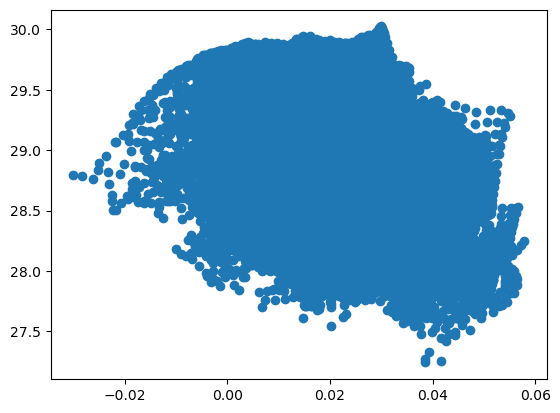

In [116]:
#make sctater plot for a region (regression wont be same but maybe simialr
plt.scatter(
    #the SST for the region
    ctrl_u_.sel(xt_ocean = slice(60,80), yt_ocean = slice(-7,0)).groupby("time.season")["MAM"].groupby('time.year').mean("time").values.flatten(),
    ctrl_sst.sel(xt_ocean = slice(60,80), yt_ocean = slice(-7,0)).groupby("time.season")["MAM"].groupby('time.year').mean("time").values.flatten())

In [ ]:
# ctrl_sst.sel(xt_ocean = slice(90,100), yt_ocean = slice(-7,0)).groupby("time.season")["SON"].groupby('time.year').mean("time")

In [ ]:
#calculate the differences as a percentage of the control


In [43]:
def DF_pcent_change(df):
    result_dict = {}
    for column in df.columns:
        if column != 'CTRL':  # Exclude 'CTRL' column from the operation
            result_dict[column] = ((df[column] - df['CTRL']) / df['CTRL']) * 100
    result_df = pd.DataFrame(result_dict)
    return result_df

In [44]:
DF_pcent_change(SST_Q_eio)

,ENSO no bias,no ENSO no bias,no ENSO
season,,,
MAM,23.022404,-80.586613,-181.106056
JJA,-19.584676,-179.858201,36.630330
SON,3.318628,29.619192,9.594336
DJF,39.731236,109.799095,21.731526


In [78]:
#write a function to see if the values in the box are significantly different from the other box
from scipy.stats import ttest_ind, f_oneway

In [166]:
ttest_ind(ctrl_U_SST_r.sel(yt_ocean = slice(-10,0),xt_ocean = slice(90,110))[1].values.flatten(), 
          VC_U_SST_r.sel(yt_ocean = slice(-10,0),xt_ocean = slice(90,110))[1].values.flatten(),
         nan_policy = "omit")

Ttest_indResult(statistic=-1.345981263163116, pvalue=0.17865362919455552)

In [82]:
def get_regr_avg_sst_q(lat, lat_r, lon, lon_r):
    ctrl_ = get_region(ctrl_SST_Q_r, lat, lat_r, lon, lon_r).to_dataframe(name="CTRL")
    VC_ = get_region(VC_SST_Q_r, lat, lat_r, lon, lon_r).to_dataframe(name="ENSO no bias")
    OC_ = get_region(OC_SST_Q_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO no bias")
    MC_ = get_region(MC_SST_Q_r, lat, lat_r, lon, lon_r).to_dataframe(name="no ENSO")
    #caluclate signifc
    
    return pd.concat([ctrl_, VC_, OC_, MC_], axis = 1)            

In [170]:
a = ctrl_SST_Q_r.sel(yt_ocean = slice(-10,0),xt_ocean = slice(90,110))[2].values.flatten()
b = OC_SST_Q_r.sel(yt_ocean = slice(-10,0),xt_ocean = slice(90,110))[2].values.flatten()

In [171]:
a = a[~np.isnan(a)]
b = b[~np.isnan(b)]

In [172]:
f_oneway(a,b)

F_onewayResult(statistic=39.59951846167715, pvalue=4.596906732727732e-10)

In [165]:
SST_Q_eio

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,2.340781,2.879685,0.454425,-1.898515
JJA,8.311274,6.683538,-6.637234,11.355721
SON,-19.722667,-20.377189,-25.564362,-21.614926
DJF,-10.467363,-14.626176,-21.960434,-12.742081


In [162]:
SST_Q_eio

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,437.192179,374.754550,340.294471,252.608495
JJA,303.203604,197.574845,199.336166,331.067134
SON,249.790789,221.532484,212.637850,261.833118
DJF,570.815616,696.149698,330.908096,330.190537


In [174]:
DF_pcent_change(SST_Q_eio)

,ENSO no bias,no ENSO no bias,no ENSO
season,,,
MAM,23.022404,-80.586613,-181.106056
JJA,-19.584676,-179.858201,36.630330
SON,3.318628,29.619192,9.594336
DJF,39.731236,109.799095,21.731526


In [124]:
DF_pcent_change(U_SST_eio)

,ENSO no bias,no ENSO no bias,no ENSO
season,,,
MAM,-14.371664,-54.930838,-60.051546
JJA,11.055006,12.243227,-9.195216
SON,-11.262005,-35.278481,-48.178610
DJF,-373.439872,-198.207137,-33.328006


In [128]:
DF_pcent_change(Z20_SST_eio)

,ENSO no bias,no ENSO no bias,no ENSO
season,,,
MAM,-29.711453,-67.981904,-56.948897
JJA,1.112055,16.585370,-11.006419
SON,10.724413,-6.106052,-7.611916
DJF,70.481124,89.985392,4.964515


In [133]:
DF_pcent_change(U_Z20_eio)

,ENSO no bias,no ENSO no bias,no ENSO
season,,,
MAM,-14.281506,-22.163642,-42.220262
JJA,-34.837567,-34.256664,9.189709
SON,-11.312789,-14.873622,4.820966
DJF,21.957017,-42.028899,-42.154607


In [99]:
U_SST_eio

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-19.805341,-16.958984,-8.926101,-7.911928
JJA,9.239107,10.260491,10.370272,8.389551
SON,11.749008,10.425835,7.604137,6.088499
DJF,-1.549901,4.238048,1.522114,-1.033350


In [126]:
U_Z20_eio

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,437.192179,374.754550,340.294471,252.608495
JJA,303.203604,197.574845,199.336166,331.067134
SON,249.790789,221.532484,212.637850,261.833118
DJF,570.815616,696.149698,330.908096,330.190537


In [125]:
DF_pcent_change(U_Z20_eio)

,ENSO no bias,no ENSO no bias,no ENSO
season,,,
MAM,-14.281506,-22.163642,-42.220262
JJA,-34.837567,-34.256664,9.189709
SON,-11.312789,-14.873622,4.820966
DJF,21.957017,-42.028899,-42.154607


In [101]:
Z20_SST_eio

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-0.009862,-0.006932,-0.003158,-0.004246
JJA,0.015022,0.015189,0.017513,0.013368
SON,0.026401,0.029232,0.024789,0.024391
DJF,0.005617,0.009575,0.010671,0.005895


In [127]:
DF_pcent_change(Z20_SST_eio)

,ENSO no bias,no ENSO no bias,no ENSO
season,,,
MAM,-29.711453,-67.981904,-56.948897
JJA,1.112055,16.585370,-11.006419
SON,10.724413,-6.106052,-7.611916
DJF,70.481124,89.985392,4.964515


In [98]:
U_SST_cion

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-21.634861,-17.801177,-22.457879,-11.211091
JJA,-7.435269,-12.182224,-5.722022,-7.394340
SON,-9.400020,-5.402982,-3.108427,-5.124138
DJF,-4.799626,-7.860834,2.192504,0.609589


In [107]:
U_SST_cios

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-25.744500,-23.510263,-19.684288,-19.159111
JJA,8.746276,7.381411,21.246855,11.812980
SON,10.390412,13.614722,18.572386,14.267164
DJF,-12.913055,-8.036249,-1.610340,-9.112396


In [99]:
U_Z20_cion

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,110.314719,55.051184,-190.763179,-112.978285
JJA,-115.593009,2.961908,-66.668544,-12.873328
SON,-180.541351,-46.467444,-63.112937,-16.269068
DJF,-128.111714,-226.836054,-111.870442,-102.289228


In [109]:
U_Z20_cios

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,141.285530,-11.986518,72.995752,35.681368
JJA,117.117028,132.697661,153.607735,111.656042
SON,-57.168080,-24.727305,40.710705,59.386044
DJF,-96.986082,-249.849735,-105.369376,-39.402299


In [100]:
Z20_SST_cion

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-0.007946,-0.000574,0.009279,0.009133
JJA,-0.005850,0.002126,-0.005110,0.007674
SON,0.006074,0.008011,0.004853,0.002773
DJF,0.004257,0.007889,0.007724,0.004161


In [111]:
Z20_SST_cios

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-0.012779,-0.000367,0.000124,-0.001310
JJA,0.002570,0.013034,0.007365,0.012495
SON,0.006439,0.016163,0.006343,0.008977
DJF,0.006678,0.002026,0.007794,0.003306


In [101]:
U_SST_wion

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-12.402854,-9.584729,-13.328696,2.835413
JJA,-9.580812,-15.096118,-13.103906,-13.053937
SON,-14.379422,-12.963488,-11.603403,-9.350265
DJF,-7.935266,-9.040990,-5.127277,-5.378343


In [102]:
U_SST_wios

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-9.880877,-8.770386,-11.944859,-9.925692
JJA,0.265626,-2.174846,3.876837,1.391545
SON,7.428477,10.168729,11.222407,9.820659
DJF,-11.463547,-7.321723,-0.643101,-6.259627


In [103]:
U_Z20_wion

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-377.015751,-415.618987,-525.038149,-299.697319
JJA,-88.589059,-50.937397,-87.258825,-5.725484
SON,-198.708134,-133.191852,-122.654628,-134.007081
DJF,-409.876086,-552.409414,-410.495999,-416.237112


In [104]:
U_Z20_wios

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,51.838443,47.531925,25.510362,70.495710
JJA,-294.562394,-289.099432,-182.801591,-301.309867
SON,-319.714157,-348.682919,-170.893044,-268.007783
DJF,-397.618929,-446.828840,-262.095569,-295.643515


In [105]:
Z20_SST_wion

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-0.000073,0.002265,0.005354,0.005970
JJA,-0.001809,0.004570,-0.000669,0.005129
SON,0.001912,0.004881,0.000006,0.001413
DJF,0.011478,0.013597,0.011270,0.006574


In [106]:
Z20_SST_wios

,CTRL,ENSO no bias,no ENSO no bias,no ENSO
season,,,,
MAM,-0.000073,0.002265,0.005354,0.005970
JJA,-0.001809,0.004570,-0.000669,0.005129
SON,0.001912,0.004881,0.000006,0.001413
DJF,0.011478,0.013597,0.011270,0.006574


In [86]:
get_region(ctrl_U_SST_r, -5,0,90,100).assign_coords(exp="CTRL").to_dataframe(name = "ctr")

,exp,ctr
season,,
MAM,CTRL,-32.104399
JJA,CTRL,4.218061
SON,CTRL,21.565832
DJF,CTRL,-5.976425


In [62]:
test = xr.concat([get_region(ctrl_U_SST_r, -5,0, 90,100).assign_coords(exp="CTRL")

In [50]:
def get_region(DS, lat, lat_r, lon, lon_r):
    return DS.sel(yt_ocean=slice(lat, lat_r),xt_ocean=slice(lon, lon_r)).mean(['yt_ocean', 'xt_ocean'])

In [78]:
print(get_region(ctrl_U_SST_r, -5,0, 90,100).values)
print(get_region(VC_U_SST_r, -5,0, 90,100).values)
print(get_region(OC_U_SST_r, -5,0, 90,100).values)
print(get_region(MC_U_SST_r, -5,0, 90,100).values)

[-32.10439928   4.21806069  21.56583221  -5.97642461]
[-30.05484456   8.01362312  31.21917439   4.59995587]
[-18.58380425  16.81872527  35.13981886   4.4293529 ]
[-15.3679297    5.43735573  24.43307454  -3.12207338]


In [79]:
print(get_region(ctrl_U_Z20_r, -5,0, 90,100).values)
print(get_region(VC_U_Z20_r, -5,0, 90,100).values)
print(get_region(OC_U_Z20_r, -5,0, 90,100).values)
print(get_region(MC_U_Z20_r, -5,0, 90,100).values)

[479.05645001 490.41877049 779.80845317 699.26089044]
[287.98030439 472.91949451 867.09298852 951.44491613]
[525.12773618 582.51602733 918.11554378 516.60188453]
[310.83336268 662.48926981 890.29456668 524.34850665]


In [80]:
print(get_region(ctrl_Z20_SST_r, -5,0, 90,100).values)
print(get_region(VC_Z20_SST_r, -5,0, 90,100).values)
print(get_region(OC_Z20_SST_r, -5,0, 90,100).values)
print(get_region(MC_Z20_SST_r, -5,0, 90,100).values)

[-0.01092617  0.01340121  0.02469105 -0.00033898]
[-0.00580437  0.01173727  0.02944319  0.00876903]
[-0.0086056   0.01382954  0.02996706  0.00979963]
[-0.00845265  0.00714914  0.02368371  0.00341953]


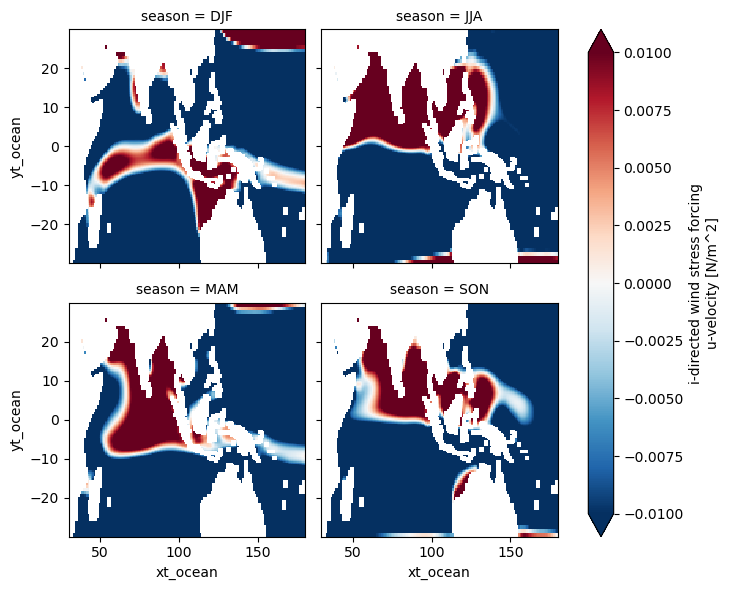

In [87]:
ctrl_u_.groupby('time.season').mean("time").sel(yt_ocean = slice(-30,30), xt_ocean = slice(30,180)).plot(col = "season", col_wrap = 2, vmin = -0.01)

In [53]:
ctrl_U_SST_r[0]

<xarray.DataArray (yt_ocean: 300, xt_ocean: 360)>
array([[        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       [        nan,         nan,         nan, ...,         nan,
                nan,         nan],
       ...,
       [-0.10094223, -0.10312811, -0.09809237, ..., -0.07753687,
        -0.08749466, -0.09494118],
       [-0.11196339, -0.12561868, -0.13354907, ..., -0.0665821 ,
        -0.08198847, -0.09702656],
       [-0.130287  , -0.1513819 , -0.16761255, ..., -0.06662526,
        -0.08727754, -0.10815053]])
Coordinates:
    season    <U3 'MAM'
  * xt_ocean  (xt_ocean) float64 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
    geolat_t  (yt_ocean, xt_ocean) float32 -77.88 -77.88 -77.88 ... 88.1 87.88
    geolon_t  (yt_ocean, xt_ocean) float32 0.5 1.5 2.5 3.5 ... 72.32 73.23 73.94
Attributes:
    standard_name:  regression between surface_downward_x_stress and sea_surf...
    units:          N/m^2 / degrees K

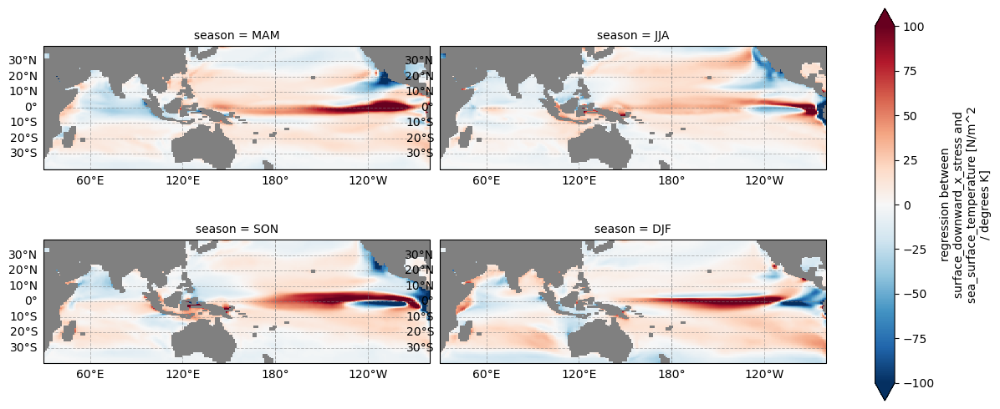

In [71]:
lat_limits = (-40, 40)
lon_limits = (-150, 100)  # Adjust as needed

# Plotting with limits
fg = (ctrl_U_SST_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-100,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
for axes in fg.axs.flat:
    axes.set_facecolor('grey')
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    gl.top_labels = False
    gl.right_labels = False


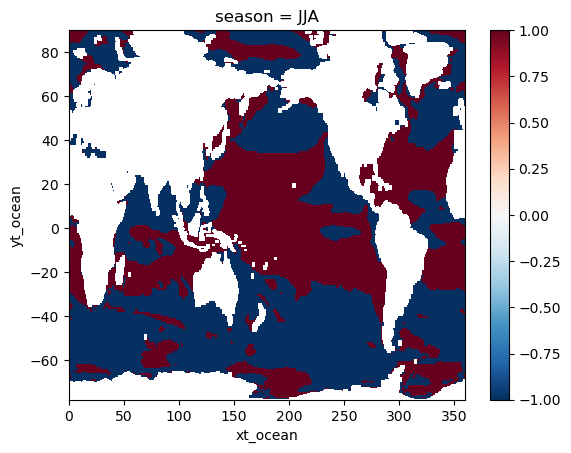

In [66]:
result = xr.where(np.isnan(ctrl_U_SST_r), np.nan, np.where(ctrl_U_SST_r < 0, -1, 1))[1].plot()

In [80]:
def plot_reg(DS, vmin):
    lat_limits = (-15, 15)
    lon_limits = (-100, -60)  # Adjust as needed

    # Plotting with limits
    fg = (DS).plot(figsize = (12,5),
        col="season",
        col_wrap=2,
        vmin=vmin,
        transform=ccrs.PlateCarree(),
        subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
        )
    for axes in fg.axs.flat:
        axes.set_facecolor('grey')
        gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

        gl.top_labels = False
        gl.right_labels = False
    return fg


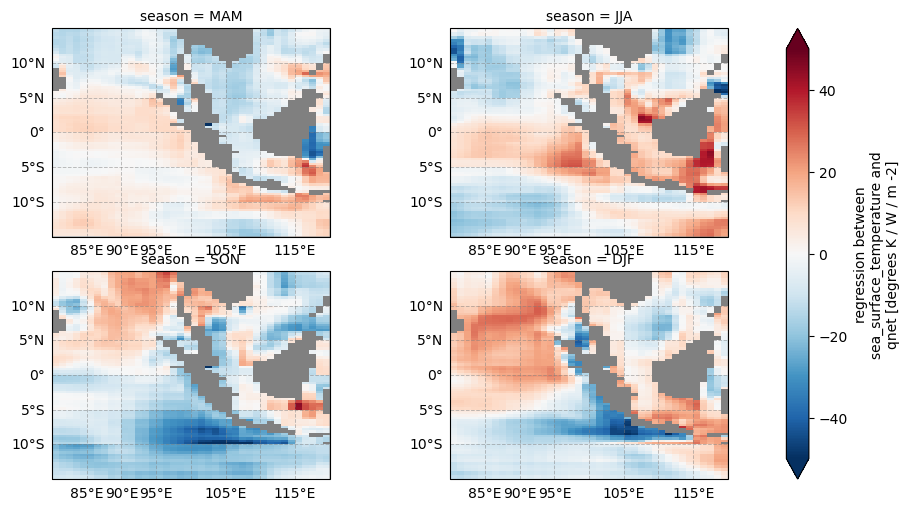

In [87]:
plot_reg(ctrl_SST_Q_r, -50)

In [68]:
ctrl_bin_USST = xr.where(np.isnan(ctrl_U_SST_r), np.nan, np.where(ctrl_U_SST_r < 0, -1, 1))
OC_bin_USST = xr.where(np.isnan(OC_U_SST_r), np.nan, np.where(OC_U_SST_r < 0, -1, 1))
MC_bin_USST = xr.where(np.isnan(MC_U_SST_r), np.nan, np.where(MC_U_SST_r < 0, -1, 1))
VC_bin_USST = xr.where(np.isnan(VC_U_SST_r), np.nan, np.where(VC_U_SST_r < 0, -1, 1))

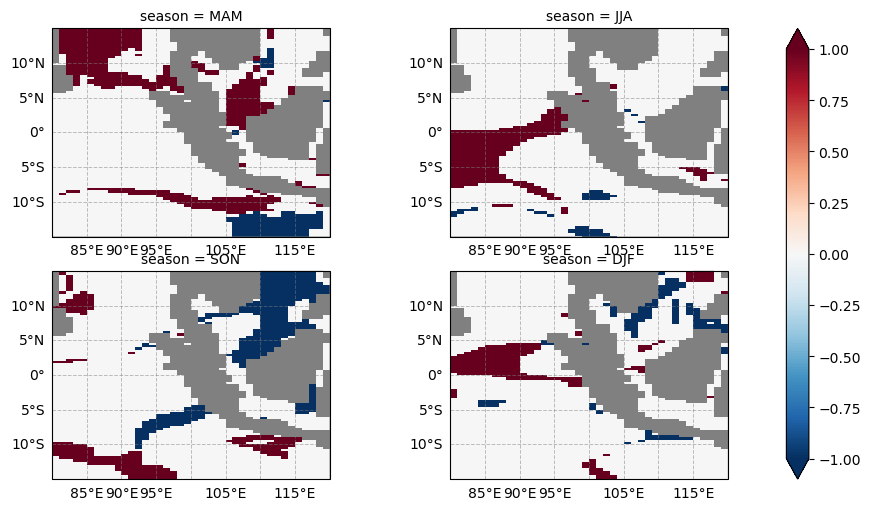

In [74]:
plot_reg(OC_bin_USST-VC_bin_USST, -1)

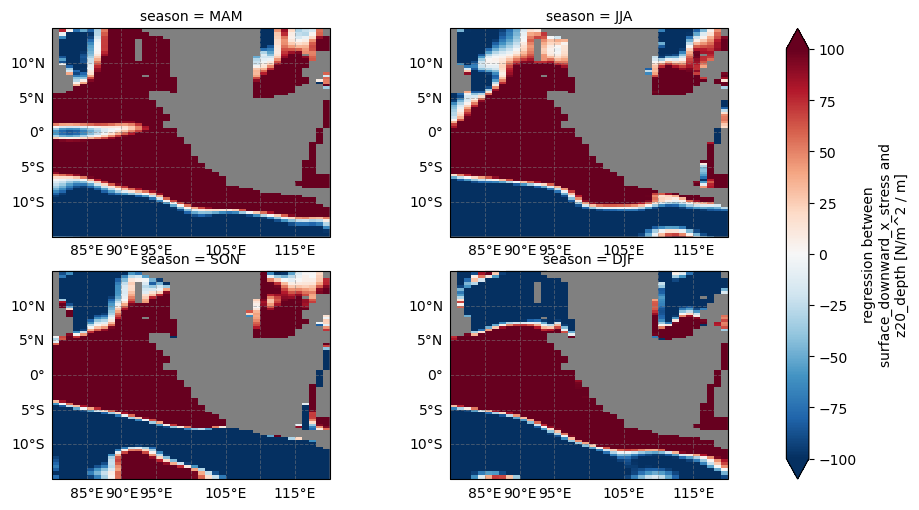

In [174]:
plot_reg(ctrl_U_Z20_r, -100)

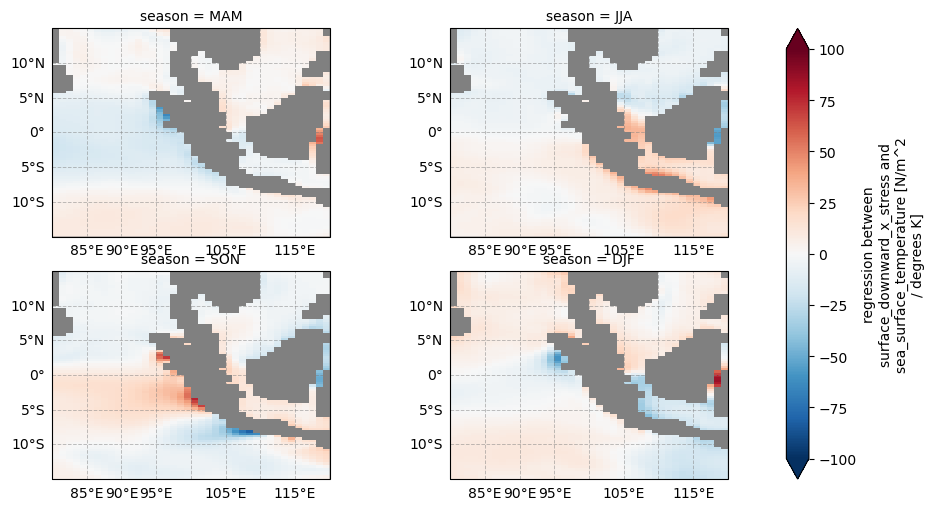

In [78]:
plot_reg(MC_U_SST_r, -100)

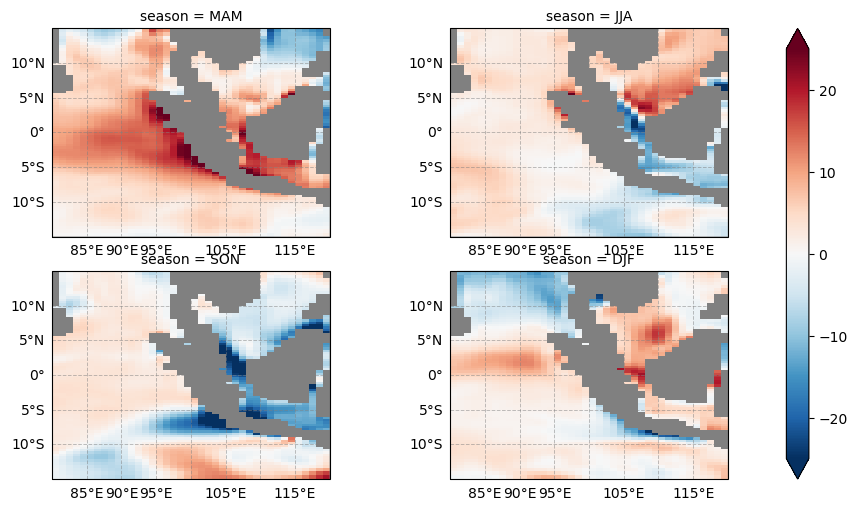

In [198]:
lat_limits = (-15, 15)
lon_limits = (-100, -60)  # Adjust as needed

# Plotting with limits
fg = (MC_U_SST_r - ctrl_U_SST_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-25,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
for axes in fg.axs.flat:
    axes.set_facecolor('grey')
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    gl.top_labels = False
    gl.right_labels = False


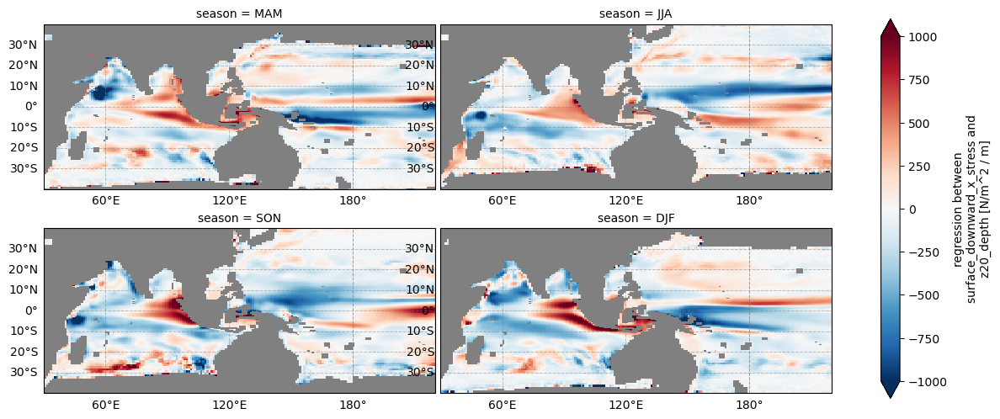

In [73]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (ctrl_U_Z20_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-1000,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
for axes in fg.axs.flat:
    axes.set_facecolor('grey')
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    gl.top_labels = False
    gl.right_labels = False

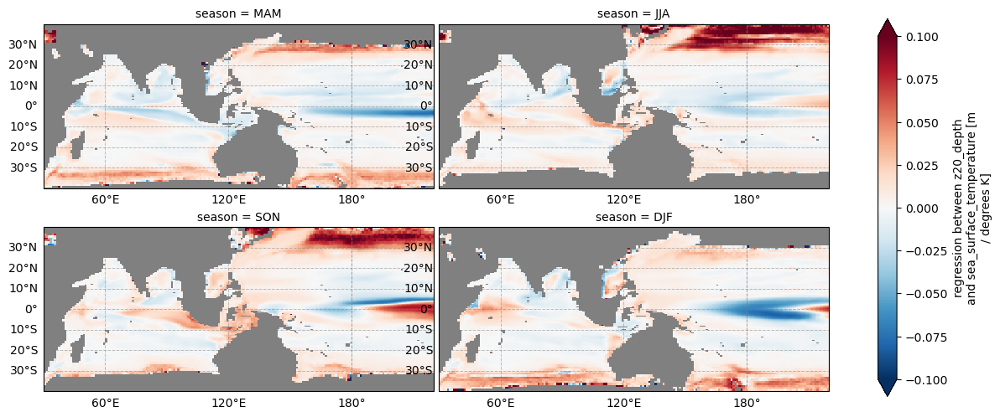

In [74]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (ctrl_Z20_SST_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-0.100,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
for axes in fg.axs.flat:
    axes.set_facecolor('grey')
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    gl.top_labels = False
    gl.right_labels = False


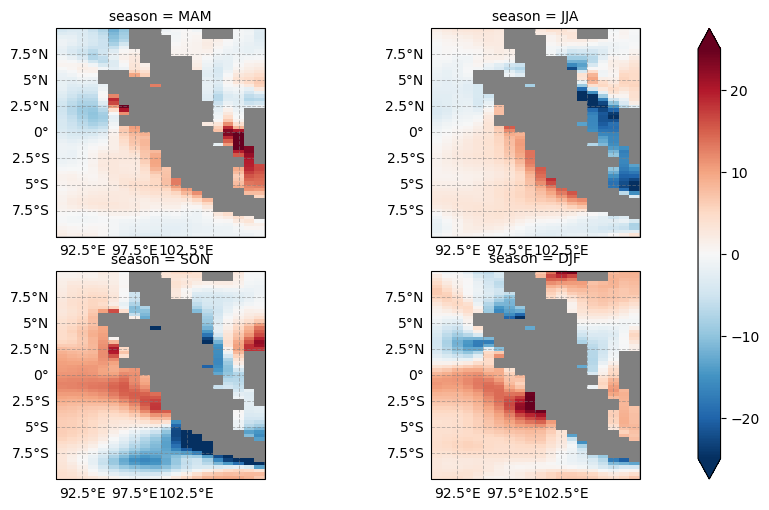

In [77]:
lat_limits = (-10, 10)
lon_limits = (-90, -70)  # Adjust as needed

# Plotting with limits
fg = (VC_U_SST_r - ctrl_U_SST_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-25,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
for axes in fg.axs.flat:
    axes.set_facecolor('grey')
    gl = axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    gl.top_labels = False
    gl.right_labels = False


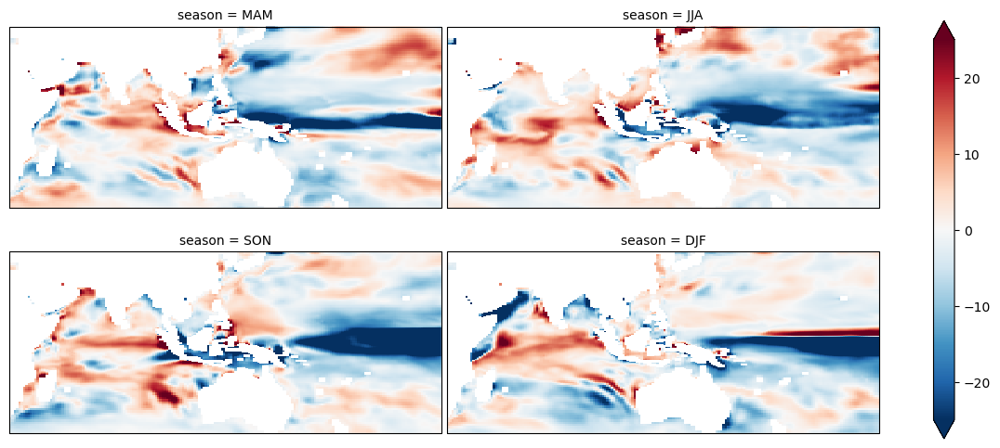

In [67]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (OC_U_SST_r - ctrl_U_SST_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-25,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
#fg.axes.set_facecolor('grey')
#gl = fg.axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

#gl.top_labels = False
#gl.right_labels = False


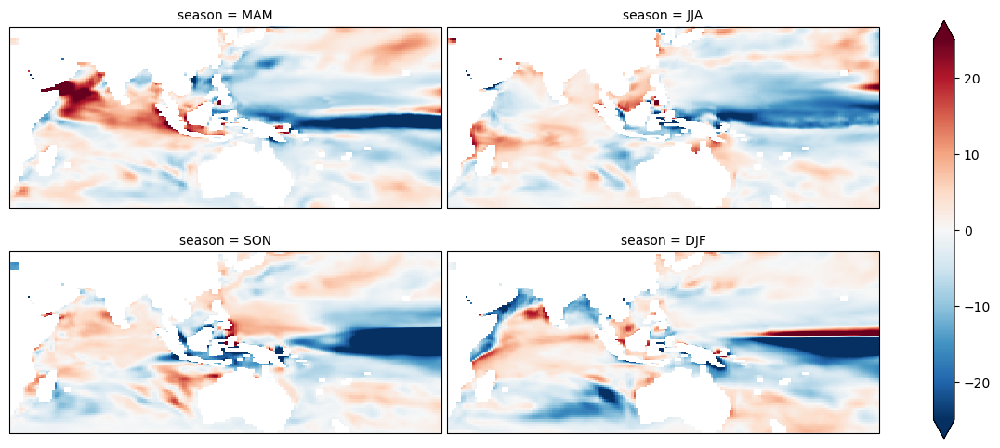

In [68]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (MC_U_SST_r - ctrl_U_SST_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-25,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
#fg.axes.set_facecolor('grey')
#gl = fg.axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

#gl.top_labels = False
#gl.right_labels = False


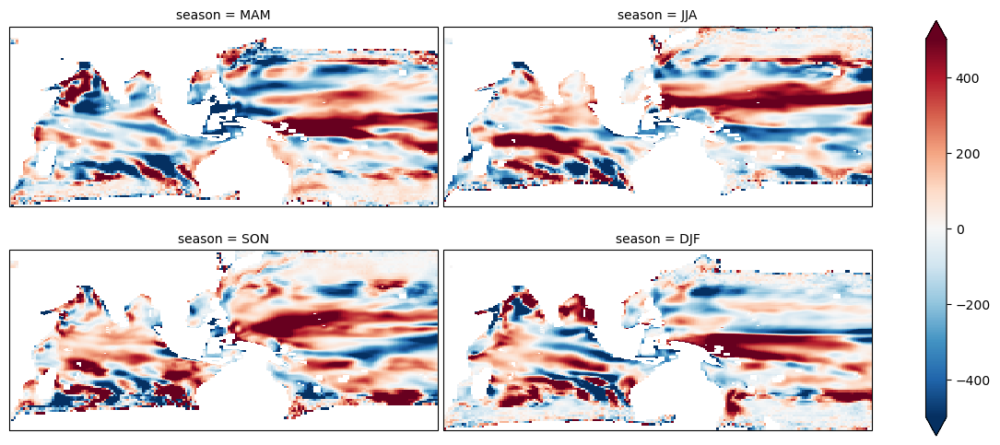

In [69]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (OC_U_Z20_r - ctrl_U_Z20_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-500,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
#fg.axes.set_facecolor('grey')
#gl = fg.axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
 #                     linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

#gl.top_labels = False
#gl.right_labels = False


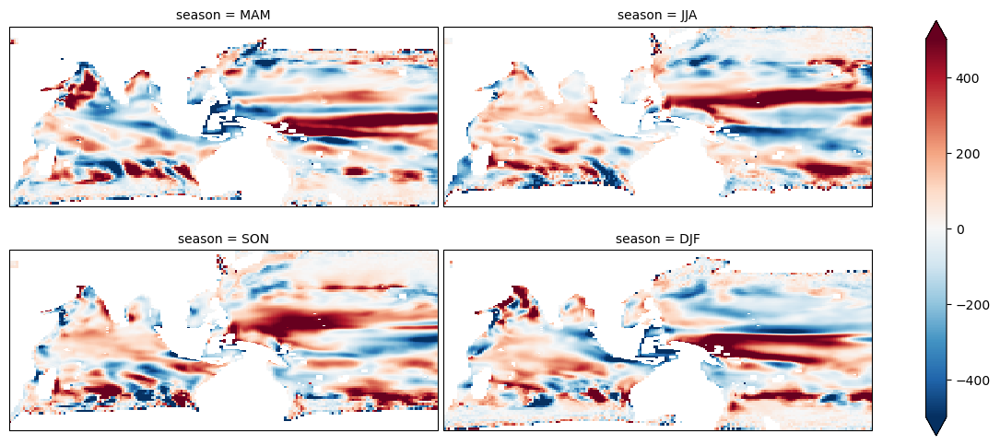

In [70]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (MC_U_Z20_r - ctrl_U_Z20_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-500,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
#fg.axes.set_facecolor('grey')
#gl = fg.axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
 #                     linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

#gl.top_labels = False
#gl.right_labels = False


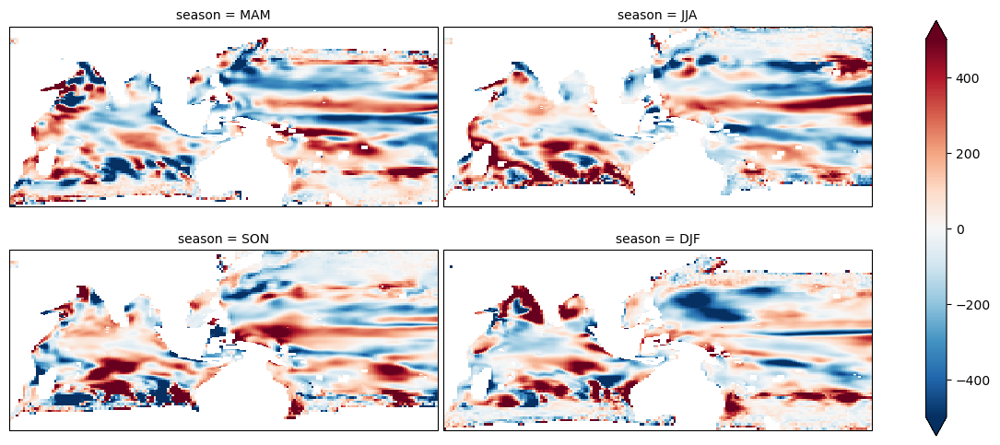

In [71]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (VC_U_Z20_r - ctrl_U_Z20_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-500,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
#fg.axes.set_facecolor('grey')
#gl = fg.axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
 #                     linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

#gl.top_labels = False
#gl.right_labels = False


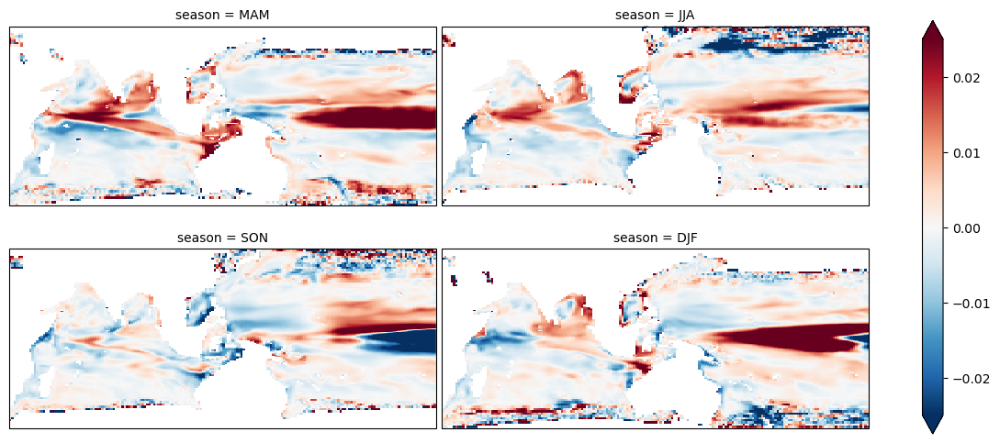

In [64]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (MC_Z20_SST_r - ctrl_Z20_SST_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-0.025,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
#fg.axes.set_facecolor('grey')
#gl = fg.axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

#gl.top_labels = False
#gl.right_labels = False


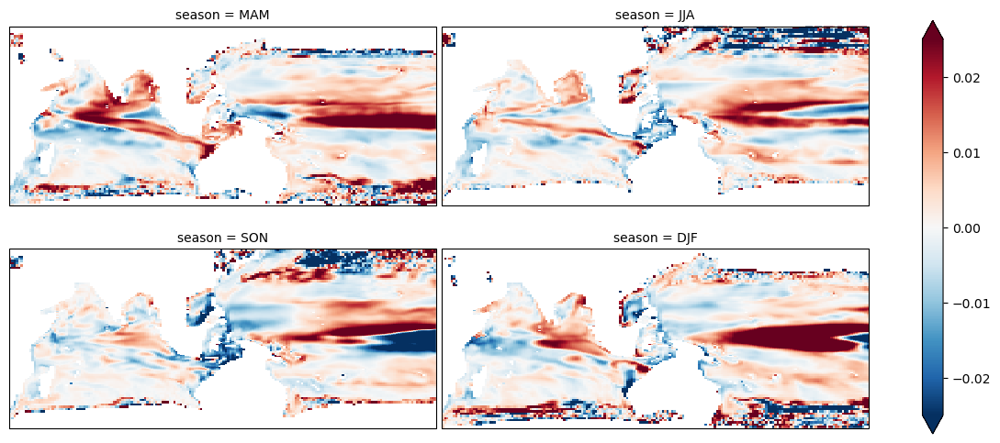

In [63]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (OC_Z20_SST_r - ctrl_Z20_SST_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-0.025,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
#fg.axes.set_facecolor('grey')
#gl = fg.axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

#gl.top_labels = False
#gl.right_labels = False


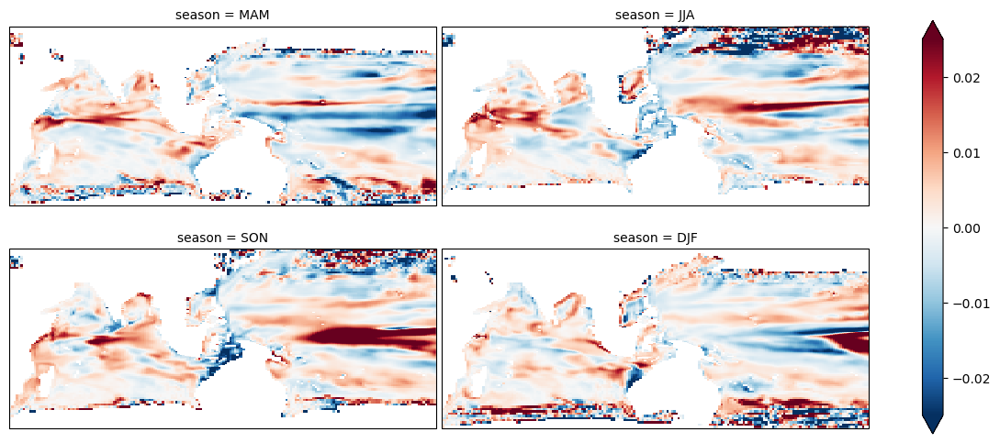

In [48]:
lat_limits = (-40, 40)
lon_limits = (-150, 40)  # Adjust as needed

# Plotting with limits
fg = (VC_Z20_SST_r - ctrl_Z20_SST_r).plot(figsize = (12,5),
    col="season",
    col_wrap=2,
    vmin=-0.025,
    transform=ccrs.PlateCarree(),
    subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
    )
#fg.axes.set_facecolor('grey')
#gl = fg.axes.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
#                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

#gl.top_labels = False
#gl.right_labels = False


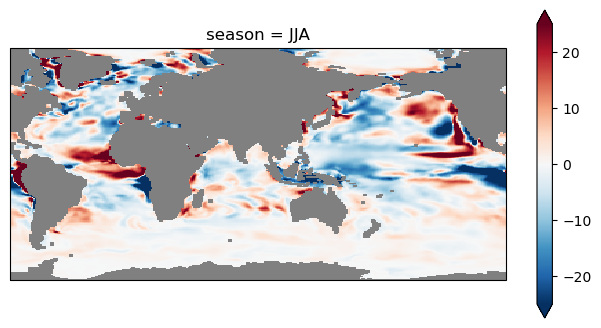

In [50]:
fig, ax = plt.subplots(figsize = (8,4),subplot_kw={'projection': ccrs.PlateCarree(central_longitude=90.0)})
#ax.coastlines()
#ax.set_extent([30, 150, -40, 40], crs=ccrs.PlateCarree())

# Add gridlines
#gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

(regress_season(VC_u_, VC_sst, "JJA") - 
  regress_season(ctrl_u_, ctrl_sst, "JJA")).plot(ax = ax, vmin = -25, transform = ccrs.PlateCarree())
ax.set_facecolor("gray")

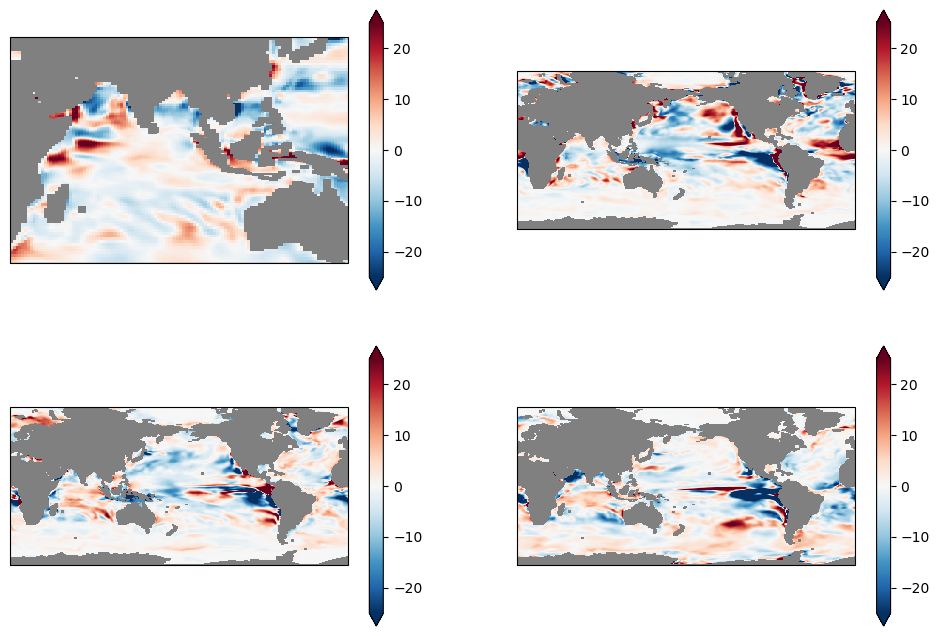

In [42]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Plot the first subplot
axes[0,0] = plt.subplot(2, 2, 1,  projection=ccrs.PlateCarree(central_longitude=180))
axes[0,0].set_extent([30, 150, -40, 40], crs=ccrs.PlateCarree())
(regress_season(VC_u_, VC_sst, "MAM") - 
  regress_season(ctrl_u_, ctrl_sst, "MAM")).plot(ax = axes[0,0], vmin = -25, transform = ccrs.PlateCarree())
axes[0,0].set_facecolor("gray")

axes[0,1] = plt.subplot(2, 2, 2,  projection=ccrs.PlateCarree(central_longitude=180))
(regress_season(VC_u_, VC_sst, "JJA") - 
  regress_season(ctrl_u_, ctrl_sst, "JJA")).plot(ax = axes[0,1], vmin = -25, transform = ccrs.PlateCarree())
axes[0,1].set_facecolor("gray")

axes[1,0] = plt.subplot(2, 2, 3,  projection=ccrs.PlateCarree(central_longitude=180))
(regress_season(VC_u_, VC_sst, "SON") - 
  regress_season(ctrl_u_, ctrl_sst, "SON")).plot(ax = axes[1,0], vmin = -25, transform = ccrs.PlateCarree())
axes[1,0].set_facecolor("gray")

axes[1,1] = plt.subplot(2, 2, 4,  projection=ccrs.PlateCarree(central_longitude=180))
(regress_season(VC_u_, VC_sst, "DJF") - 
  regress_season(ctrl_u_, ctrl_sst, "DJF")).plot(ax = axes[1,1], vmin = -25, transform = ccrs.PlateCarree())
axes[1,1].set_facecolor("gray")

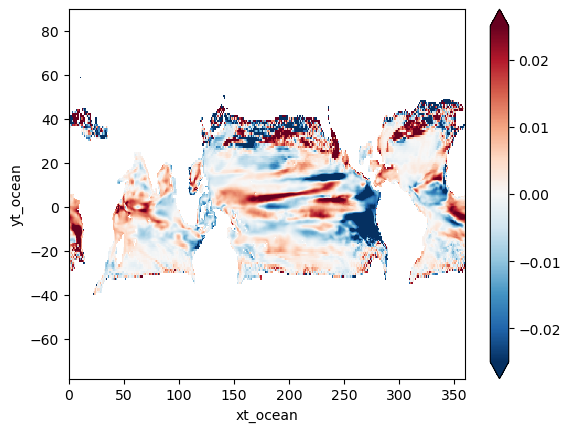

In [26]:
(regress_season(VC_z20, VC_sst, "JJA") - 
  regress_season(ctrl_z20, ctrl_sst, "JJA")).plot(vmin = -0.025)

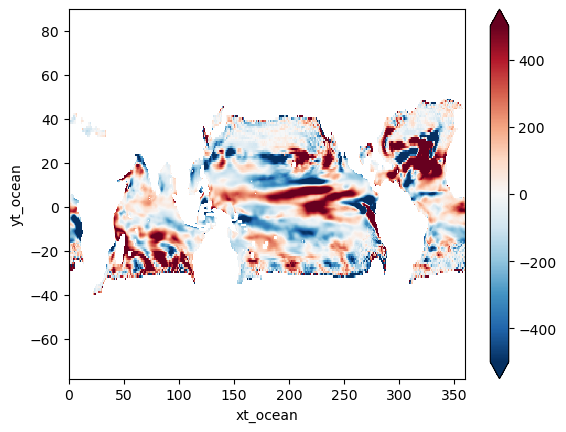

In [27]:
(regress_season(VC_u_, VC_z20, "JJA") - 
  regress_season(ctrl_u_, ctrl_z20, "JJA")).plot(vmin = -500)

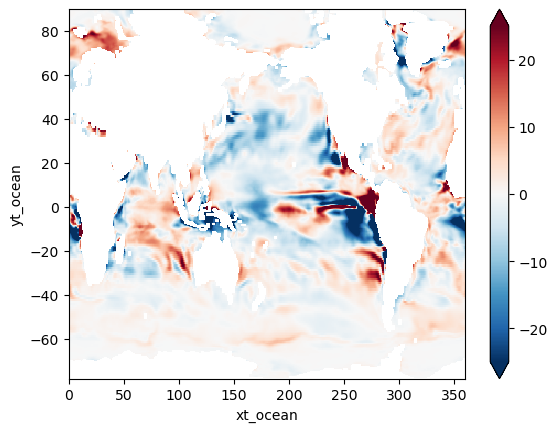

In [105]:
(regress_season(VC_u_, VC_sst, "SON") - 
  regress_season(ctrl_u_, ctrl_sst, "SON")).plot(vmin = -25)

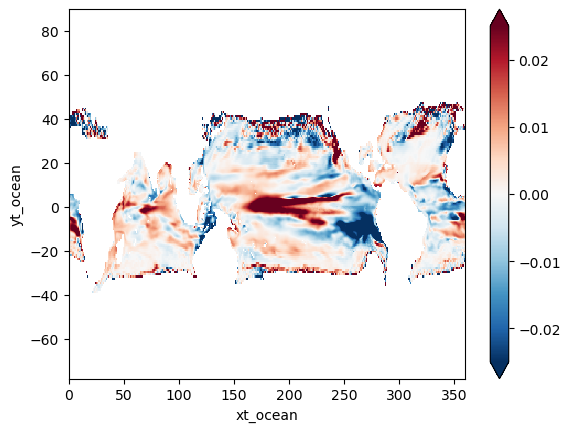

In [104]:
(regress_season(VC_z20, VC_sst, "SON") - 
  regress_season(ctrl_z20, ctrl_sst, "SON")).plot(vmin = -0.025)

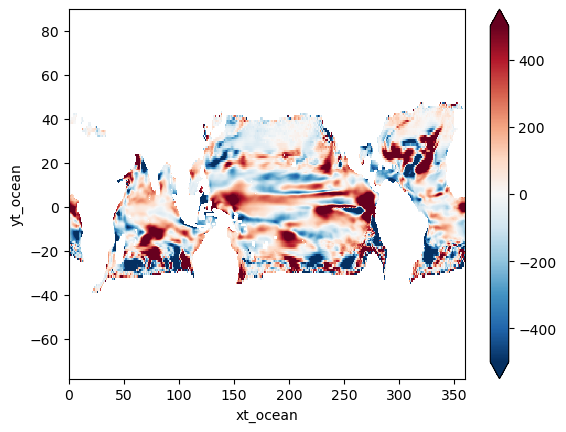

In [106]:
(regress_season(VC_u_, VC_z20, "SON") - 
  regress_season(ctrl_u_, ctrl_z20, "SON")).plot(vmin = -500)

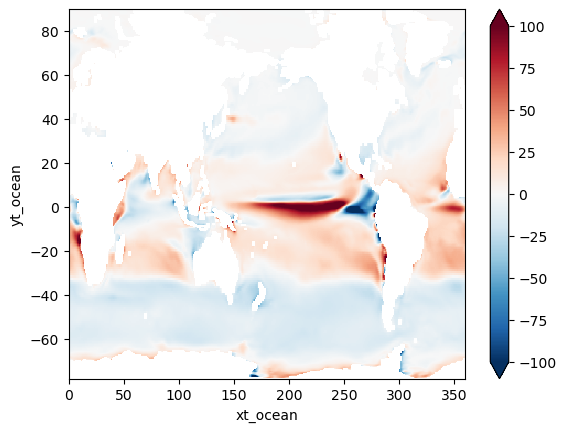

In [94]:
regress_season(ctrl_u_, ctrl_sst, "DJF").plot(vmin = -100)

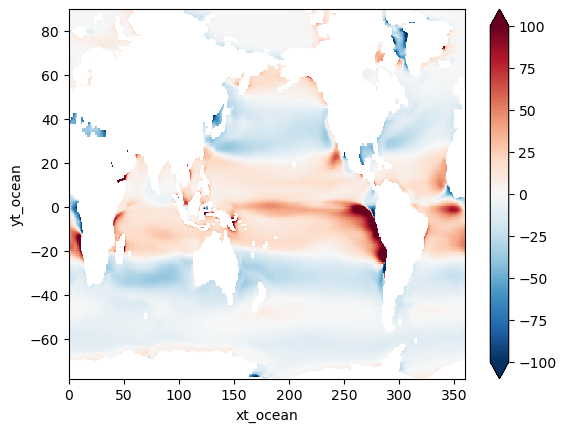

In [30]:
regress(ctrl_u_, ctrl_sst).plot(vmin = -100)

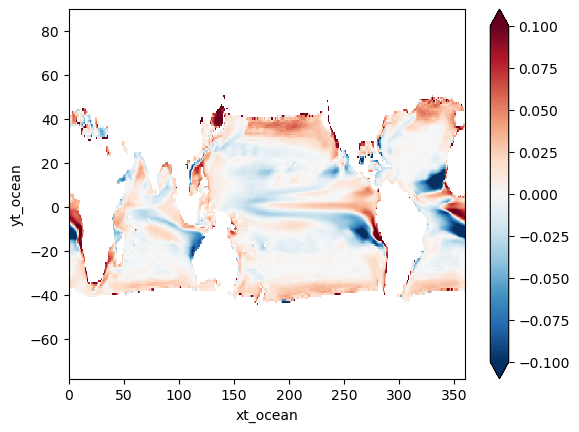

In [31]:
regress(ctrl_z20, ctrl_sst).plot(vmin = -0.1)

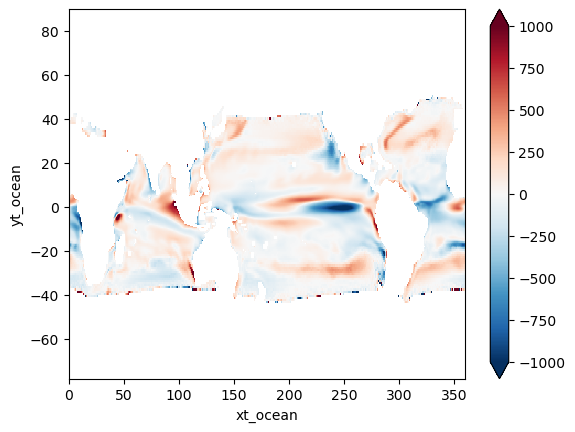

In [32]:
regress(ctrl_u_, ctrl_z20).plot(vmin = -1000)

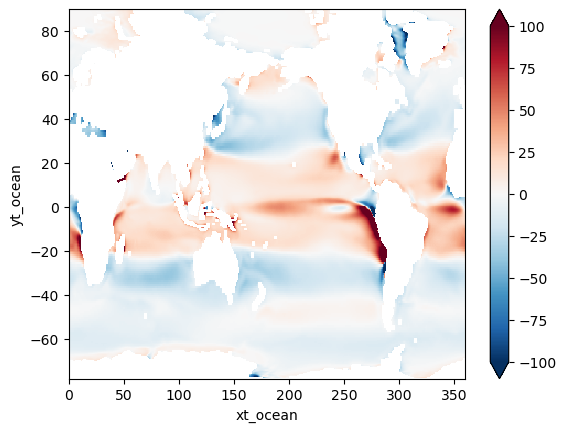

In [35]:
regress(VC_u_, VC_sst).plot(vmin = -100)

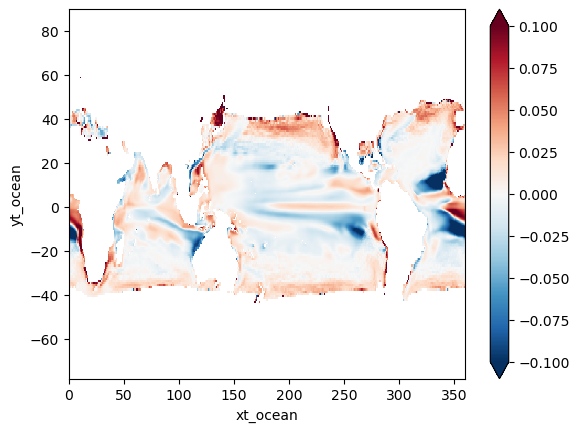

In [33]:
regress(VC_z20, VC_sst).plot(vmin = -0.1)

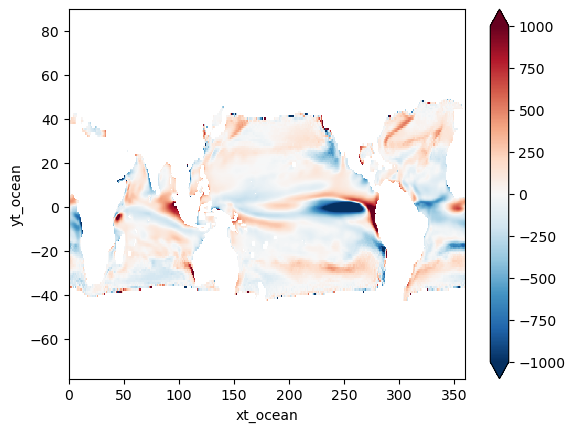

In [34]:
regress(VC_u_, VC_z20).plot(vmin = -1000)

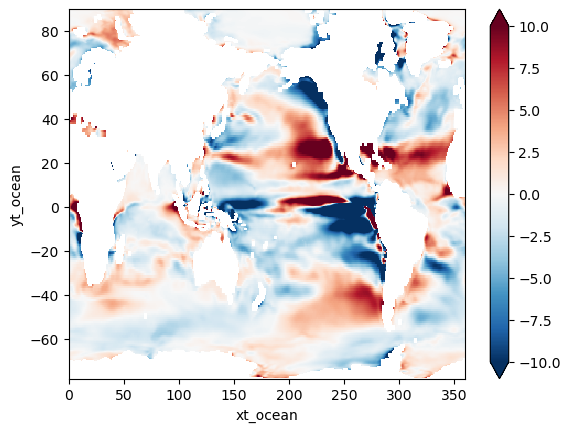

In [42]:
(regress(VC_u_, VC_sst) - regress(ctrl_u_, ctrl_sst)).plot(vmin = -10)

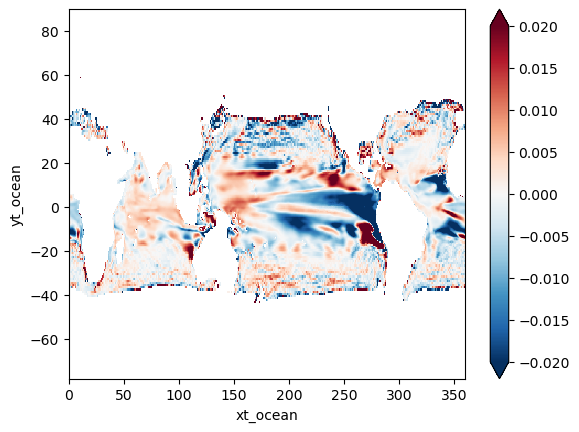

In [44]:
(regress(VC_z20, VC_sst) - regress(ctrl_z20, ctrl_sst)).plot(vmin = -0.02)

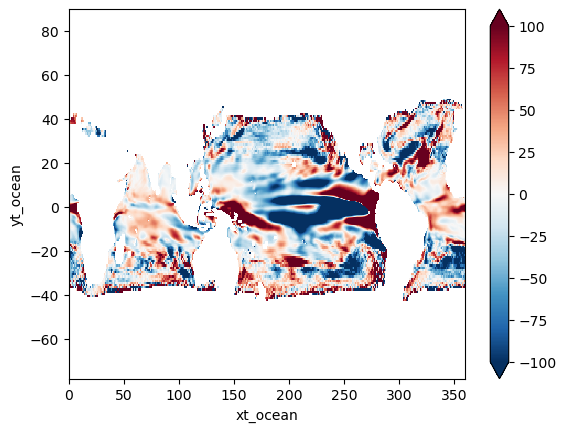

In [41]:
(regress(VC_u_, VC_z20) - regress(ctrl_u_, ctrl_z20)).plot(vmin = -100)

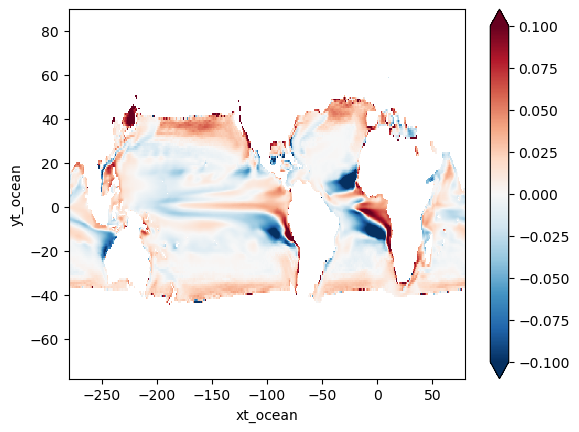

In [36]:
regress(ctrl_z20, ctrl_sst).plot(vmin = -0.1)

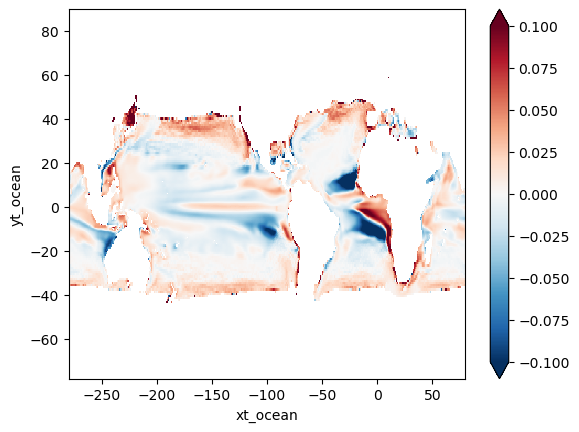

In [37]:
regress(VC_z20, VC_sst).plot(vmin = -0.1)

In [24]:
ctrl_sst_u_r = regress(ctrl_sst, ctrl_u_)

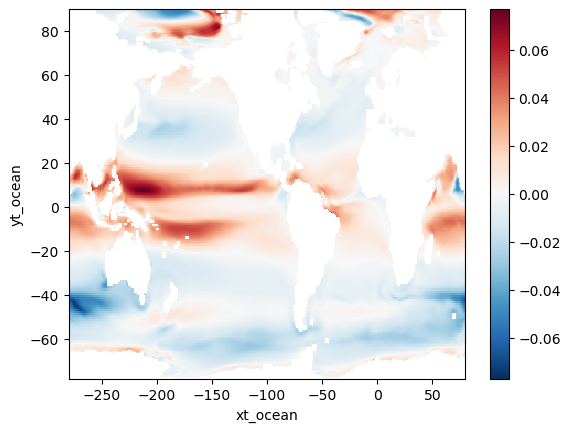

In [107]:
ctrl_sst_u_r.plot()

In [104]:
VC_sst_u_r = regress(VC_sst, VC_u_)

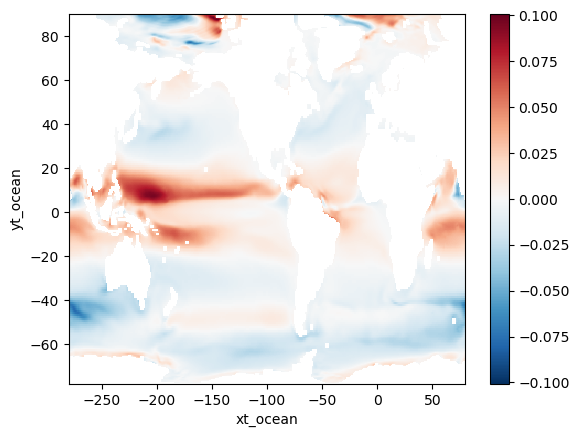

In [105]:
VC_sst_u_r.plot()

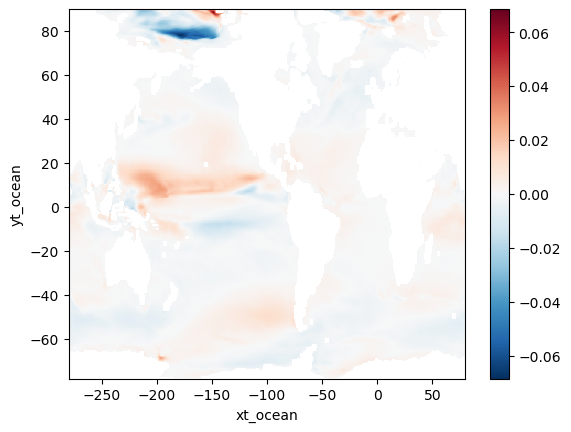

In [108]:
(VC_sst_u_r - ctrL_sst_u_r).plot()

In [49]:
#load in tau
data_dir = "/g/data/e14/sm2435/Exps_ACCESS_initial/"

In [50]:
ctrl_u = xr.open_dataset(data_dir+"ctrl_uwnd.nc", use_cftime=True, chunks= {"time":240})

In [51]:
ctrl_u = ctrl_u.tauu.compute()

In [52]:
ctrl_v = xr.open_dataset(data_dir+"ctrl_vwnd.nc", use_cftime=True, chunks= {"time":240})

In [53]:
ctrl_v = ctrl_v.tauv.compute()

In [54]:
VC_u = xr.open_dataset(data_dir+"var_uwnd.nc", use_cftime=True, chunks= {"time":240})
VC_u = VC_u.tauu.compute()

In [55]:
VC_v = xr.open_dataset(data_dir+"var_vwnd.nc", use_cftime=True, chunks= {"time":240})
VC_v = VC_v.tauv.compute()

In [59]:
def roll_lon_u(df):
    df.coords['xu_ocean'] = (df.coords['xu_ocean']) % 360# - 180
    df = df.sortby(df.xu_ocean)
    return df

In [72]:
def coriolis_param(lat):
    day = (24*60*60)-(4*60)# this is 23hrs 56mins
    om = (2*np.pi)/day
    f = 2*om*np.sin(lat * np.pi / 180)
    return f

def ekman(taux, tauy):
    rho = 1036#kgm^-3
    f = coriolis_param(taux.yu_ocean)
    dtydx = tauy.differentiate('xu_ocean') / (110e3 * np.cos(tauy.yu_ocean * np.pi / 180))
    dtxdy = taux.differentiate('yu_ocean') / (110e3)
    #ek = (1/(rho*f))*(dtydx-dtxdy)
    return (dtydx-dtxdy)



In [60]:
VC_v = roll_lon_u(VC_v)
VC_u = roll_lon_u(VC_u)


In [61]:
ctrl_v = roll_lon_u(ctrl_v)
ctrl_u = roll_lon_u(ctrl_u)


In [73]:
ctrl_ek = ekman(ctrl_u, ctrl_v)

In [74]:
VC_ek = ekman(VC_u, VC_v)

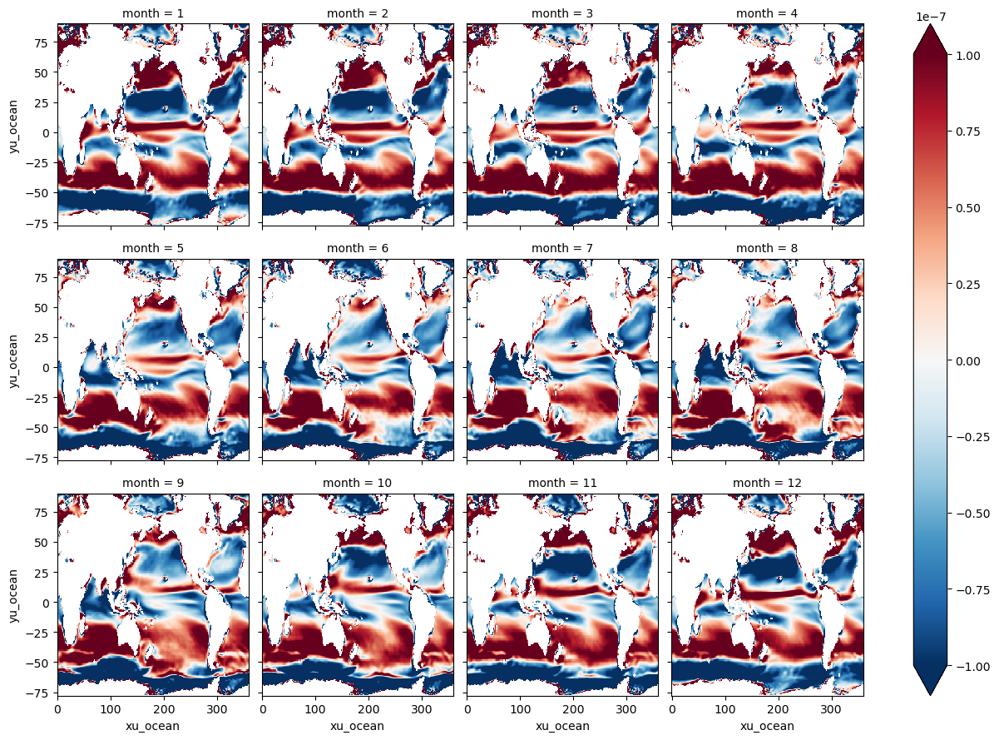

In [83]:
ctrl_ek.groupby("time.month").mean("time").plot(col = "month", col_wrap = 4, vmin = -1e-7)

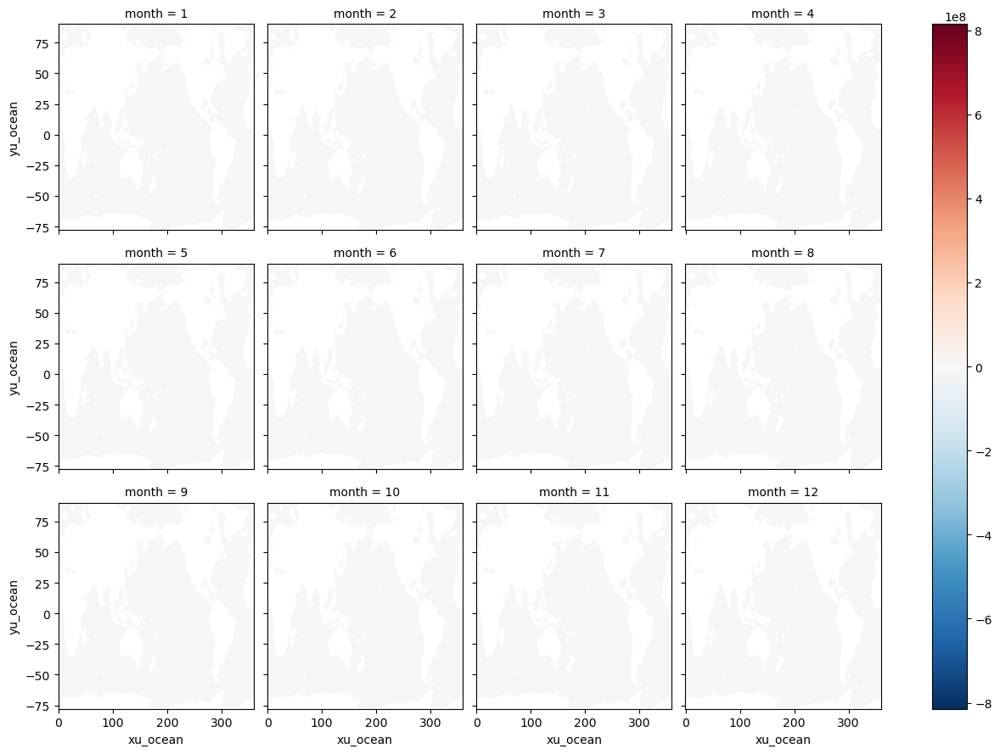

In [76]:
(VC_ek.groupby("time.month").mean("time") - 
 ctrl_ek.groupby("time.month").mean("time")).plot(col = "month", col_wrap = 4)

In [70]:
# Get the coordinates
xt_coords = ctrl_sst['xt_ocean']
yt_coords = ctrl_sst['yt_ocean']

# Initialize an empty DataArray to store the regression coefficients
regression_coefficients = xr.DataArray(
    np.nan,
    dims=('xt_ocean', 'yt_ocean'),
    coords={'xt_ocean': xt_coords, 'yt_ocean': yt_coords},
)

In [80]:
def linear_trend(x, y):
    # Check for NaN values and skip them
    valid = ~np.isnan(x) & ~np.isnan(y)
    if valid.sum() < 2:
        return np.nan
    else:
        pf = np.polyfit(x[valid], y[valid], 1)
        return pf[0]

In [81]:
# Loop over each grid cell and calculate the regression coefficient
for i, xt in enumerate(xt_coords):
    for j, yt in enumerate(yt_coords):
        sst_cell = ctrl_sst.sel(xt_ocean=xt, yt_ocean=yt).values
        tauu_cell = ctrl_u_.sel(xt_ocean=xt, yt_ocean=yt).values
        regression_coefficients[i, j] = linear_trend(sst_cell, tauu_cell)


KeyboardInterrupt: 

In [83]:
regression_coefficients

<xarray.DataArray 'sst' (time: 2400, yt_ocean: 300, xt_ocean: 360)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.5 -278.5 -277.5 -276.5 ... 77.5 78.5 79.5
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0951-01-16 12:00:00 ... 1150-12-16 12:00:00
    geolat_t  (yt_ocean, xt_ocean) float32 -77.88 -77.88 -77.88 ... 65.63 65.21
    geolon_t  (yt_ocean, xt_ocean) float32 -279.5 -278.5 -277.5 ... 79.97 79.99
Attributes:
    long_name:      Potential temperature
    units:          degrees K
    valid_range:    [-10. 500.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    standard_name:  sea_surface_temperature

In [65]:
#now write a fucntion to output bias and to optioanlly plot
def plot_bias_sig(exp, ctrl, freq=None, temp_scale = 2):
    lat_limits = (-40, 40)
    lon_limits = (-150, 40) 
    bias = (exp.groupby('time.month').mean('time') - ctrl.groupby('time.month').mean('time'))

    fg = bias.plot.contourf(col='month', col_wrap = 4,  transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = -1*temp_scale, vmax = temp_scale, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='Qnet bias ($W / m -2$)'))
    for i, ax in enumerate(fg.axs.flat):
        ax.coastlines()
        #ax.set_facecolor('grey')
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

        if i in [0,1,2,3,4,5,6,7]:
            gl.bottom_labels = False
        if i in [1,2,3,5,6,7,9,10,11]:
            gl.left_labels = False
        gl.top_labels = False
        gl.right_labels = False               

    #now add the month labels\n",
    titles =['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun','Jul',
             'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
    for ax,title in zip(fg.axs.flatten(),titles):
        ax.set_title(title )
        ax.axhline(y=-15, color='black', linestyle='--', linewidth=1)  # 15S
        ax.axhline(y=15, color='black', linestyle='--', linewidth=1)
    return

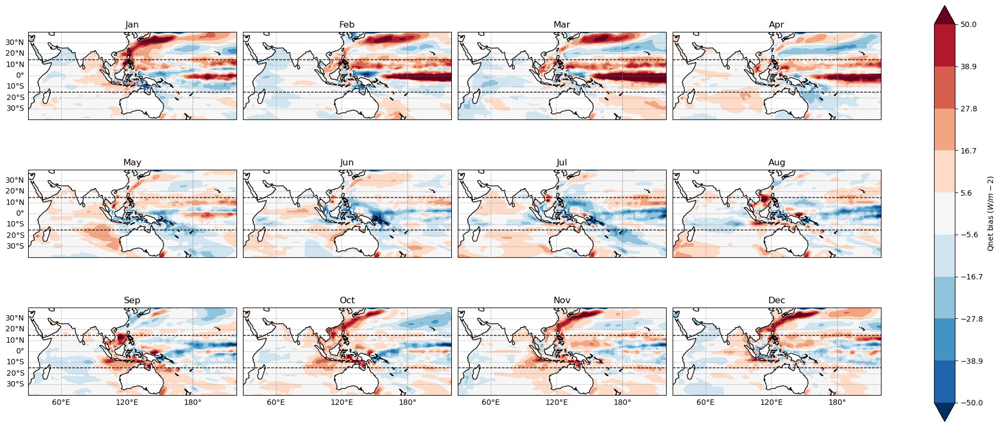

In [93]:
plot_bias_sig(OC_q, ctrl_q, temp_scale=50)

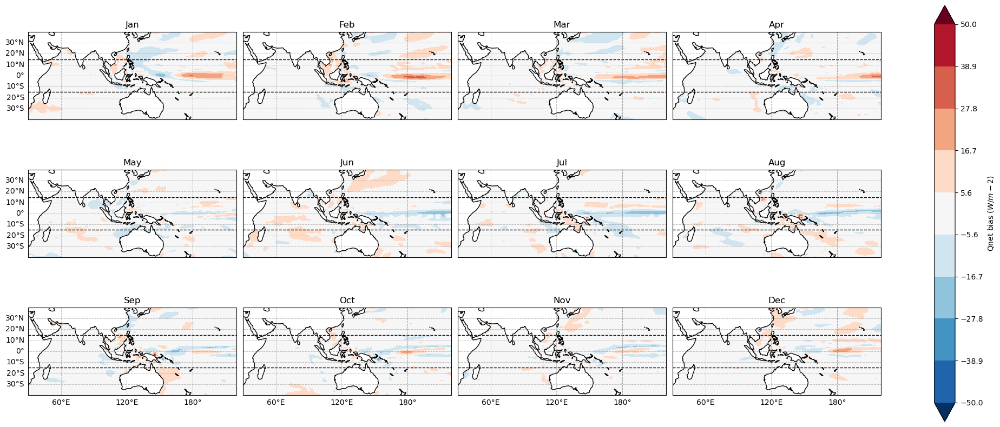

In [94]:
plot_bias_sig(MC_q, ctrl_q, temp_scale=50)

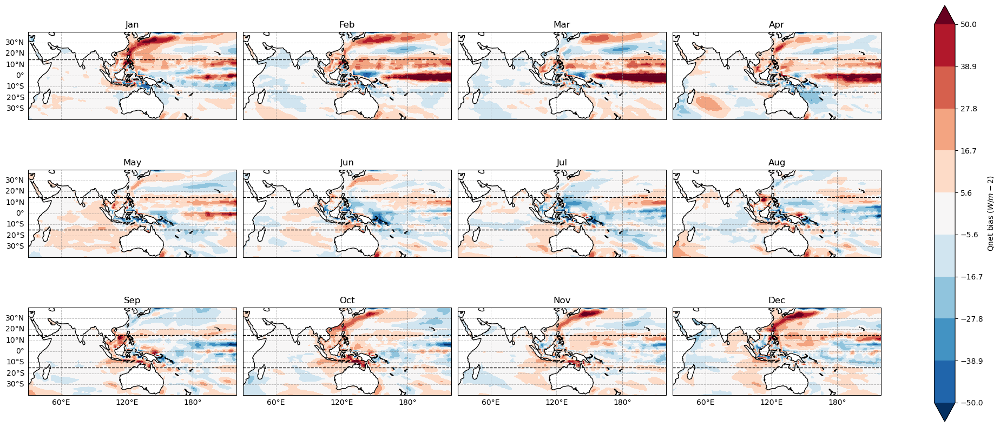

In [95]:
plot_bias_sig(VC_q, ctrl_q, temp_scale=50)

In [8]:
#calculate standrad deviaion difference in SST for each experiemnt
ctrl_sd = ctrl_sst.groupby('time.month').std("time")
MC_sd = MC_sst.groupby('time.month').std("time")
OC_sd = OC_sst.groupby('time.month').std("time")
VC_sd = VC_sst.groupby('time.month').std("time")


In [48]:
#calculate standrad deviaion difference in SST for each experiemnt
ctrl_sd = ctrl_sst.groupby('time.season').std("time")
MC_sd = MC_sst.groupby('time.season').std("time")
OC_sd = OC_sst.groupby('time.season').std("time")
VC_sd = VC_sst.groupby('time.season').std("time")


In [9]:
lat_limits = (-40, 40)
lon_limits = (-150, 100) 

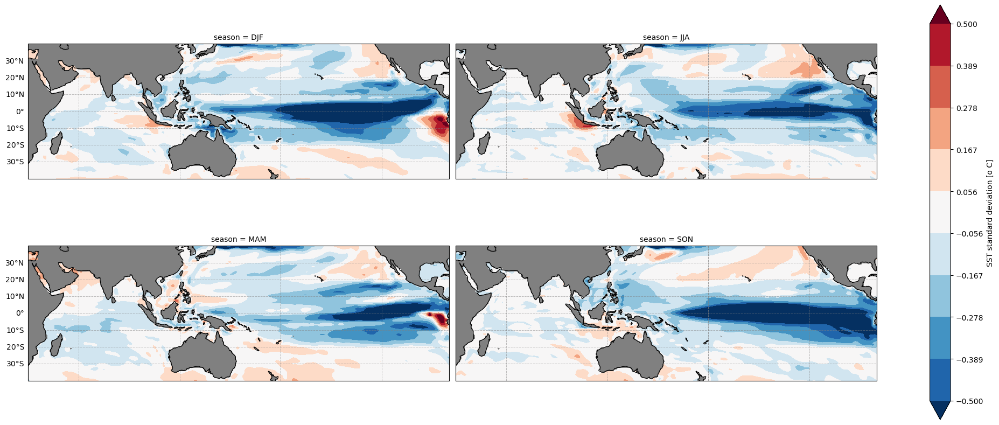

In [37]:
fg = (OC_sd - ctrl_sd).plot.contourf(col="season", col_wrap = 2, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3]:
        gl.bottom_labels = False
    if i in [1,3,5]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

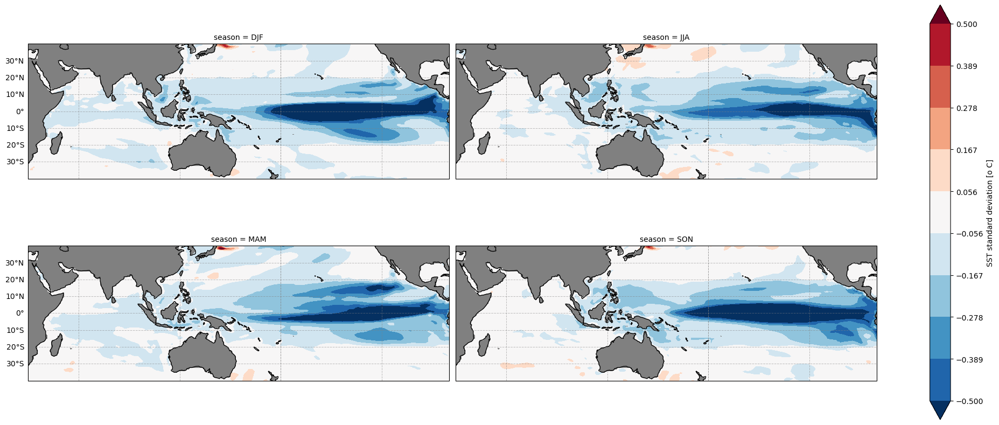

In [38]:
fg = (MC_sd - ctrl_sd).plot.contourf(col="season", col_wrap = 2, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3]:
        gl.bottom_labels = False
    if i in [1,3,5]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

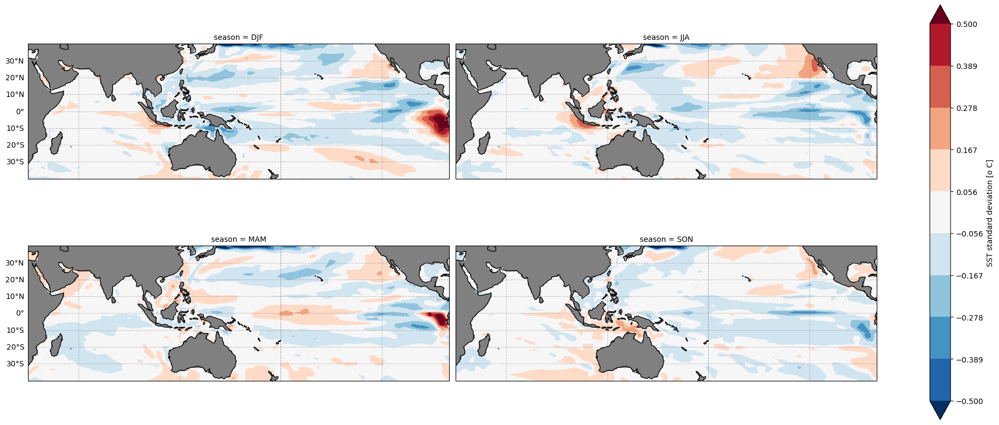

In [39]:
fg = (VC_sd - ctrl_sd).plot.contourf(col="season", col_wrap = 2, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3]:
        gl.bottom_labels = False
    if i in [1,3,5]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

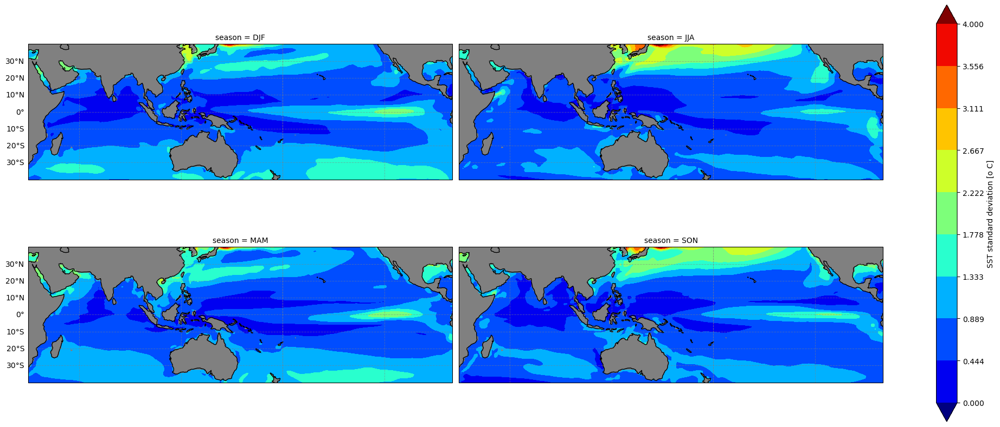

In [51]:
fg = (ctrl_sd).plot.contourf(col="season", col_wrap = 2, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = 0, vmax = 4, levels =10, extend = 'both',  cmap = 'jet',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3]:
        gl.bottom_labels = False
    if i in [1,3,5]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

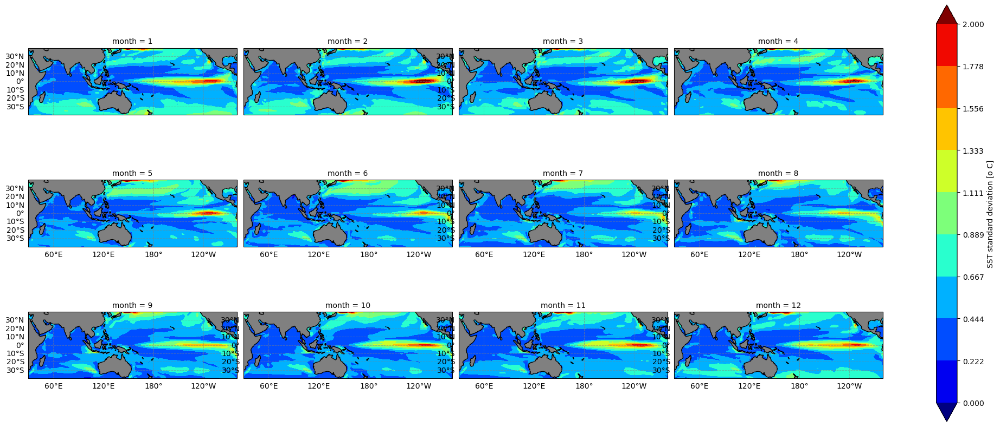

In [47]:
fg = (ctrl_sd).plot.contourf(col="month", col_wrap = 4, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = 0, vmax = 2, levels =10, extend = 'both',  cmap = 'jet',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3]:
        gl.bottom_labels = False
    if i in [1,3,5]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

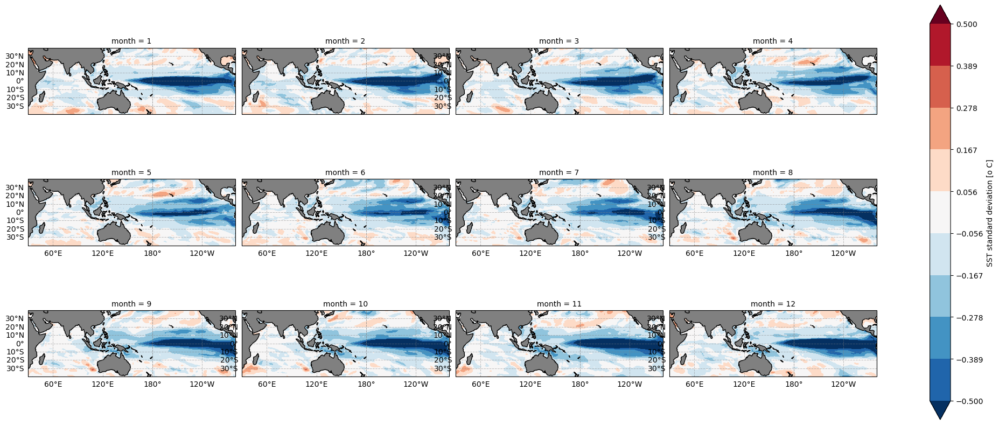

In [10]:
fg = (OC_sd - VC_sd).plot.contourf(col="month", col_wrap = 4, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3]:
        gl.bottom_labels = False
    if i in [1,3,5]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

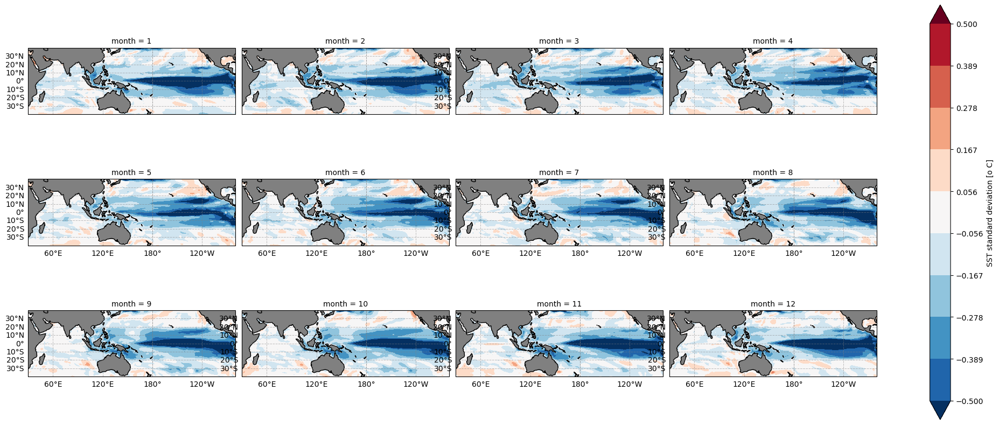

In [41]:
fg = (OC_sd - ctrl_sd).plot.contourf(col="month", col_wrap = 4, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3]:
        gl.bottom_labels = False
    if i in [1,3,5]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

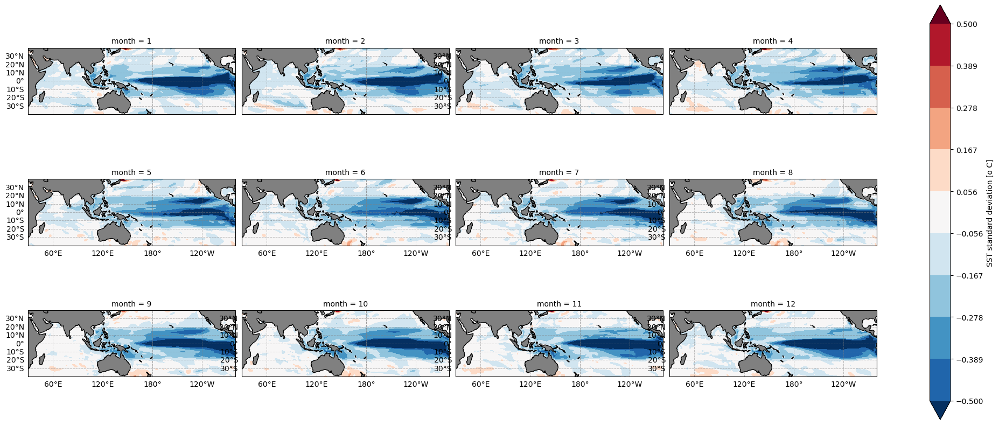

In [42]:
fg = (MC_sd - ctrl_sd).plot.contourf(col="month", col_wrap = 4, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3]:
        gl.bottom_labels = False
    if i in [1,3,5]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

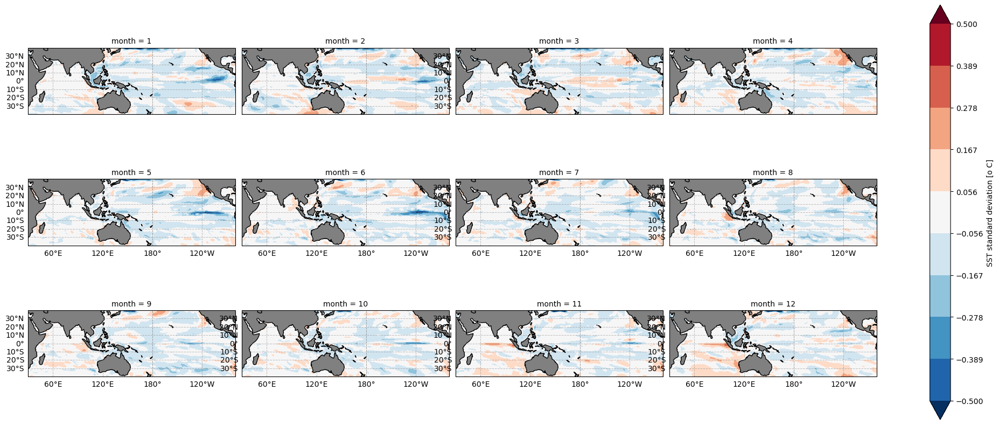

In [43]:
fg = (VC_sd - ctrl_sd).plot.contourf(col="month", col_wrap = 4, transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.PlateCarree(central_longitude = 180), "xlim": lon_limits, "ylim": lat_limits},
                          figsize=(20,8), vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
for i, ax in enumerate(fg.axs.flat):
    ax.coastlines()
    ax.set_facecolor('grey')
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=0.7, color='gray', alpha=0.5, linestyle='--')

    if i in [0,1,2,3]:
        gl.bottom_labels = False
    if i in [1,3,5]:
        gl.left_labels = False
    gl.top_labels = False
    gl.right_labels = False  

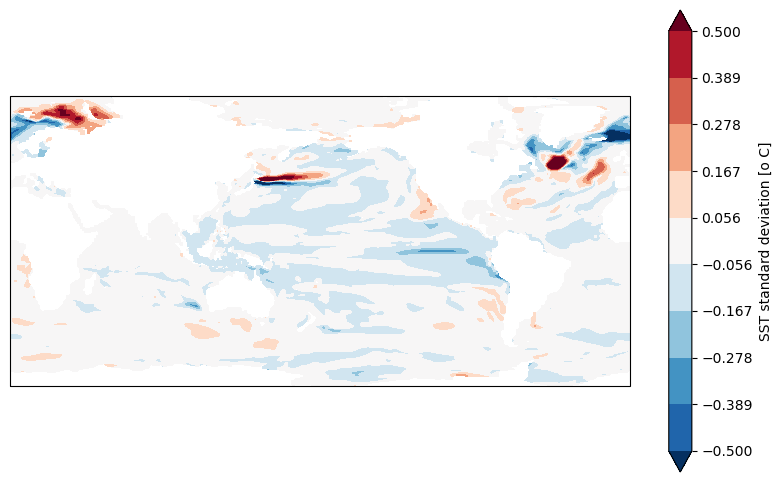

In [183]:
plt.figure(figsize = (10,6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

(VC_sd.mean("month") - ctrl_sd.mean("month")).plot.contourf(ax = ax, transform=ccrs.PlateCarree(),
                          vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))

Text(0.5, 1.0, 'no ENSO no bias - CTRL')

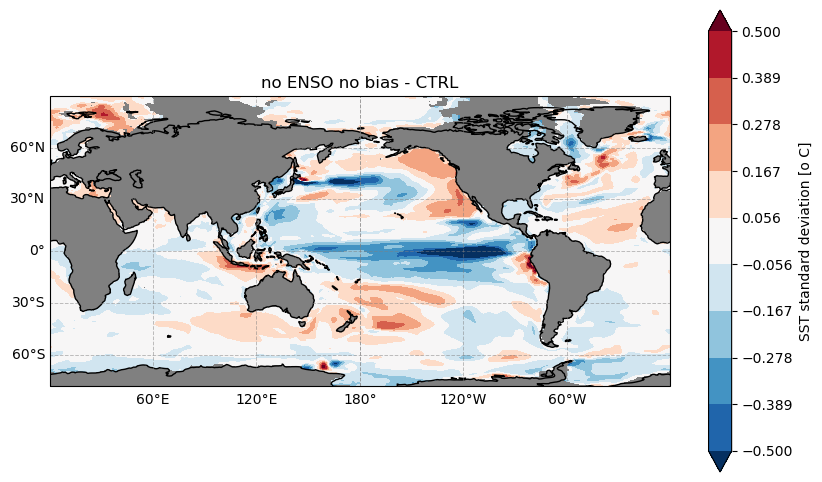

In [98]:
plt.figure(figsize = (10,6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

(OC_sd - ctrl_sd).plot.contourf(ax = ax, transform=ccrs.PlateCarree(),
                          vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
ax.coastlines()
ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False               
plt.title("no ENSO no bias - CTRL")



Text(0.5, 1.0, 'no ENSO - CTRL')

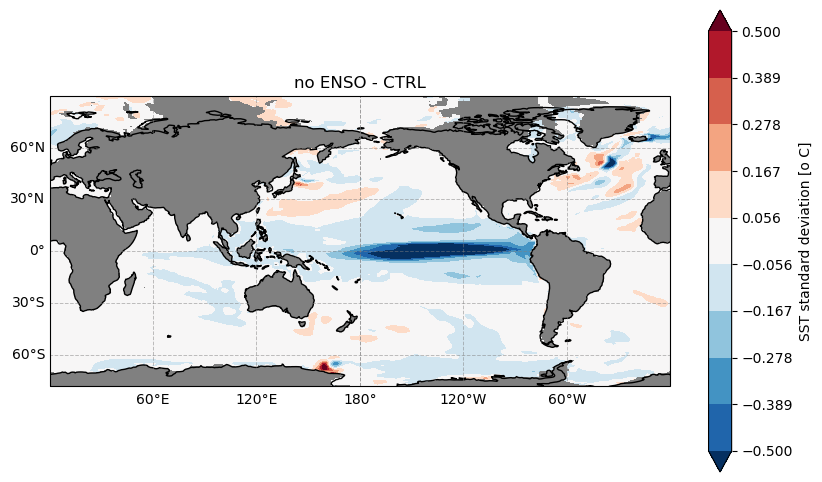

In [99]:
plt.figure(figsize = (10,6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

(MC_sd - ctrl_sd).plot.contourf(ax = ax, transform=ccrs.PlateCarree(),
                          vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
ax.coastlines()
ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False               
plt.title("no ENSO - CTRL")



Text(0.5, 1.0, 'ENSO no bias - CTRL')

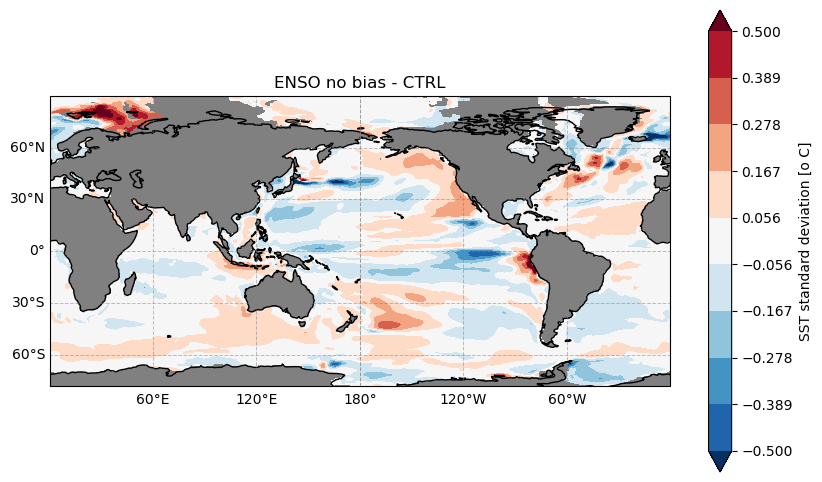

In [100]:
plt.figure(figsize = (10,6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

(VC_sd - ctrl_sd).plot.contourf(ax = ax, transform=ccrs.PlateCarree(),
                          vmin = -0.5, vmax = 0.5, levels =10, extend = 'both',  cmap = 'RdBu_r',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
ax.coastlines()
ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False               
plt.title("ENSO no bias - CTRL")



Text(0.5, 1.0, 'CTRL')

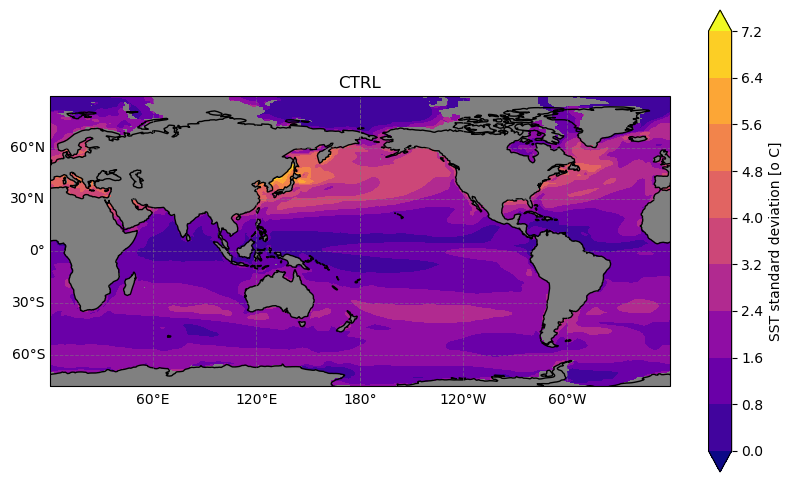

In [94]:
plt.figure(figsize = (10,6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

(ctrl_sd).plot.contourf(ax = ax, transform=ccrs.PlateCarree(),
                           levels =10, extend = 'both',  cmap = 'plasma',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
ax.coastlines()
ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False               
plt.title("CTRL")


Text(0.5, 1.0, 'ENSO no bias')

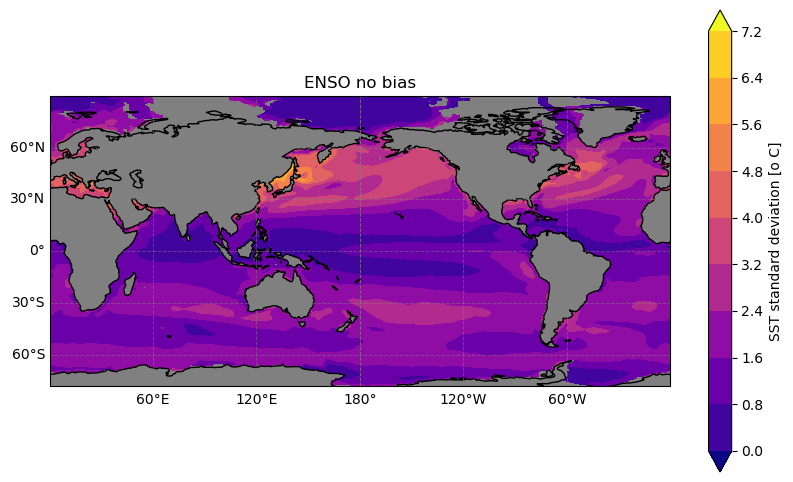

In [95]:
plt.figure(figsize = (10,6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

(VC_sd).plot.contourf(ax = ax, transform=ccrs.PlateCarree(),
                           levels =10, extend = 'both',  cmap = 'plasma',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
ax.coastlines()
ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False               
plt.title("ENSO no bias")



Text(0.5, 1.0, 'no ENSO no bias')

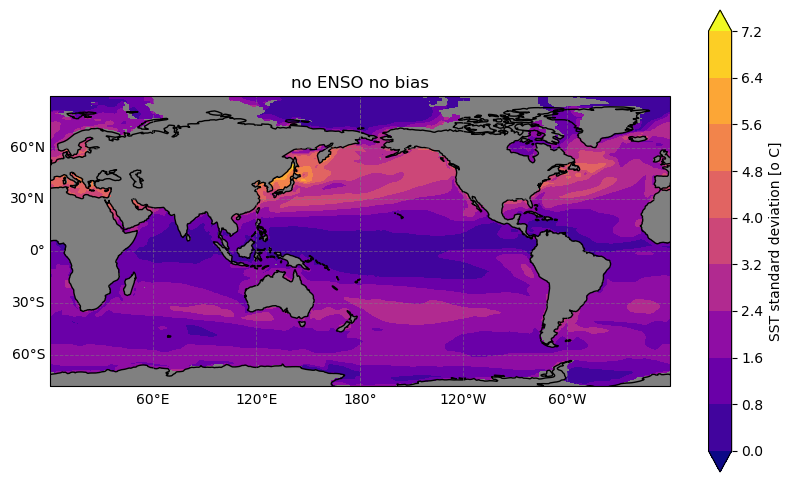

In [96]:
plt.figure(figsize = (10,6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

(OC_sd).plot.contourf(ax = ax, transform=ccrs.PlateCarree(),
                           levels =10, extend = 'both',  cmap = 'plasma',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
ax.coastlines()
ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False               
plt.title("no ENSO no bias")



Text(0.5, 1.0, 'no ENSO')

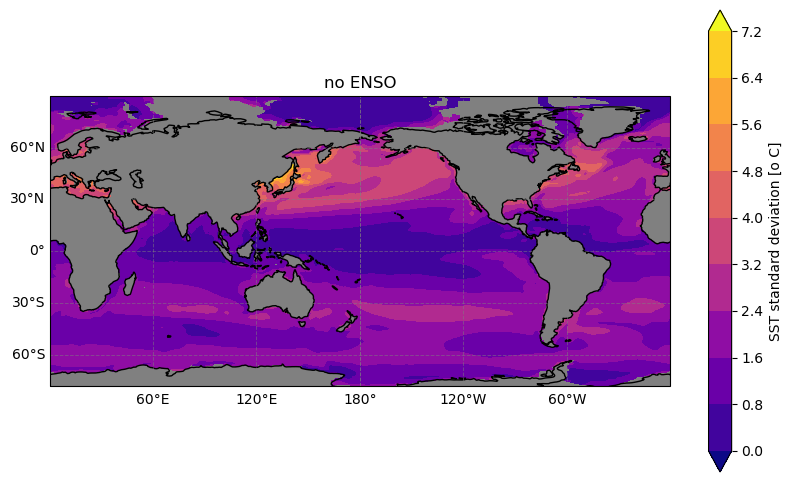

In [97]:
plt.figure(figsize = (10,6))
ax = plt.axes(projection=ccrs.PlateCarree(central_longitude=180))

(MC_sd).plot.contourf(ax = ax, transform=ccrs.PlateCarree(),
                           levels =10, extend = 'both',  cmap = 'plasma',
                            cbar_kwargs=dict(label='SST standard deviation [o C]'))
ax.coastlines()
ax.set_facecolor('grey')
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.7, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False               
plt.title("no ENSO")



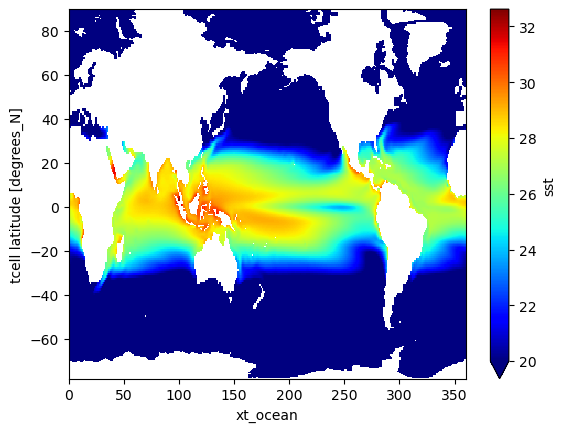

In [112]:
ctrl_sst.mean("time").plot(vmin = 20, cmap = "jet")

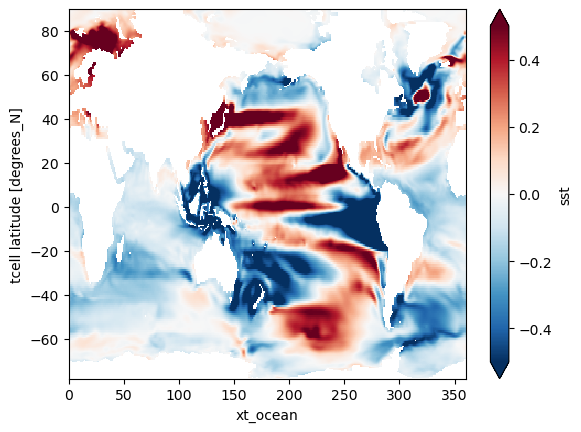

In [120]:
(VC_sst.mean("time")-ctrl_sst.mean("time")).plot(vmin = -0.5)